# Crawling

# 1. Crawling

In [ ]:
%pip install playwright pandas
!playwright install chromium

Note: you may need to restart the kernel to use updated packages.


In [ ]:
GMAPS_URL = "https://www.google.com/maps/place/Grand+Mercure+Yogyakarta+Adi+Sucipto/@-7.7836348,110.3898571,17z/data=!4m9!3m8!1s0x2e7a59c53e8f9e4f:0x428ec2bf72c50217!5m2!4m1!1i2!8m2!3d-7.7836348!4d110.392432!16s%2Fg%2F11c5s5nkm4?entry=ttu&hl=id"

TARGET_REVIEWS = 5000       # belum bisa dapet sesuai target (kalo banyak)
CSV_PATH = "mercure.csv"
HEADLESS = False

# 🔽 SORT
# 0 = Paling relevan
# 1 = Terbaru
# 2 = Rating tertinggi
# 3 = Rating terendah
SORT_MODE = 2

In [ ]:
import re
from playwright.async_api import async_playwright

async def crawl_reviews(url, target, existing_ids, sort_mode=1):
    new_data = []

    print("🚀 Launch browser")
    async with async_playwright() as p:
        browser = await p.chromium.launch(
            headless=HEADLESS,
            args=[
                "--disable-blink-features=AutomationControlled",
                "--no-sandbox",
                "--disable-dev-shm-usage",
            ]
        )

        page = await browser.new_page()

        print("🌐 Open Google Maps URL")
        await page.goto(url, timeout=60000)
        await page.wait_for_timeout(1000)
        await page.wait_for_selector("canvas", timeout=5000)
        await page.reload()
        await page.wait_for_timeout(1000)
        print("✅ Halaman kebuka")

        # Klik Reviews
        review_btn = page.locator(
            'button:has-text("Ulasan"), button:has-text("Reviews")'
        )

        if await review_btn.count() == 0:
            print("❌ Tombol Reviews tidak ketemu")
            await browser.close()
            return new_data

        await review_btn.first.click()
        await page.wait_for_timeout(2000)
        print("✅ Masuk tab Reviews")

        try:
            await page.wait_for_selector('div[data-review-id]', timeout=10000)
        except:
            print("⚠️ Review belum muncul, lanjut deteksi panel")

        # ======================
        # SORT
        # ======================
    
        
        print("🔀 Set sort ke TERBARU")

        try:
            # Tombol "Paling relevan"
            sort_btn = page.locator(
                'button[aria-label*="relevan"], button[aria-label*="relevance"], button:has-text("Paling relevan")'
            ).first

            await sort_btn.wait_for(state="visible", timeout=10000)
            await sort_btn.click()
            await page.wait_for_timeout(800)

            # pilih opsi berdasarkan data-index
            option = page.locator(
                f'div[role="menuitemradio"][data-index="{sort_mode}"]'
            ).first

            await option.wait_for(state="visible", timeout=10000)
            await option.click()
            await page.wait_for_timeout(2500)

            print("✅ Sort berhasil")

        except Exception as e:
            print(f"⚠️ Gagal set sort: {e}")

        async def detect_scrollable():
            selectors = [
                'div.m6QErb.DxyBCb.kA9KIf.dS8AEf',
                'div.m6QErb.XiKgde',
                'div[aria-label*="Reviews"]',
                'div[aria-label*="Ulasan"]',
            ]

            for s in selectors:
                el = page.locator(s).first
                if await el.count() and await el.locator('div[data-review-id]').count():
                    return el, s

            fallback = page.locator(
                'xpath=//div[@data-review-id]/ancestor::div[contains(@class,"scrollable")][1]'
            )
            if await fallback.count():
                return fallback.first, "xpath fallback"

            return None, None

        scrollable, selector = await detect_scrollable()

        if not scrollable:
            print("❌ Panel review tidak ketemu")
            await browser.close()
            return new_data

        print(f"✅ Scrollable ketemu pakai: {selector}")

        # ======================
        # SCROLL (ANTI NGACO)
        # ======================
        print("🔄 Scroll mulai")

        MAX_DOM = target + 20  # buffer
        last_count = 0
        stuck = 0

        while True:
            reviews = scrollable.locator('div[data-review-id]')
            count = await reviews.count()

            print(f"📦 Review di DOM: {count}")

            if count >= MAX_DOM:
                print("🛑 DOM cukup, stop scroll")
                break

            if count == last_count:
                stuck += 1
            else:
                stuck = 0

            if stuck >= 4:
                print("🛑 Scroll mentok")
                break

            last_count = count

            await scrollable.evaluate("el => el.scrollTop = el.scrollHeight")
            await page.wait_for_timeout(1200)

        # ======================
        # EXPAND REVIEW
        # ======================
        print("📖 Expand review panjang (smart mode)")

        expanded = 0
        stuck = 0

        while True:
            if len(new_data) >= target:
                print("   - Target sudah tercapai, stop expand")
                break

            more_btn = scrollable.locator(
                'button:has-text("Lainnya"), button:has-text("More")'
            ).first

            if await more_btn.count() == 0:
                print("   - Tidak ada tombol expand lagi")
                break

            # ⛔ cek apakah tombol ini terkait Tripadvisor
            btn_text = (await more_btn.inner_text()).lower()

            if "tripadvisor" in btn_text:
                print("   ⏭️ Skip expand (Tripadvisor button)")
                break
            try:
                await more_btn.click(timeout=1000)
                expanded += 1
                stuck = 0
                print(f"   - Expanded {expanded}")
                await page.wait_for_timeout(120)
            except:
                stuck += 1
                if stuck >= 3:
                    print("   - Expand mentok, stop")
                    break


        # ======================
        # EXTRACT DATA
        # ======================
        print("🧠 Extract data")

        reviews = scrollable.locator('div[data-review-id]')
        total = await reviews.count()
        print(f"📊 Total review di DOM: {total}")

        for i in range(total):
            print(f"\n➡️ Proses index {i}")

            if len(new_data) >= target:
                print("🛑 Target tercapai, break extract")
                break

            r = reviews.nth(i)

            # review_id
            try:
                review_id = await r.get_attribute("data-review-id")
                # print(f"   review_id: {review_id}")
            except Exception as e:
                print(f"   ❌ Gagal ambil review_id: {e}")
                continue

            if not review_id:
                print("   ⚠️ review_id kosong, skip")
                continue

            if review_id in existing_ids:
                print("   ⏭️ review_id sudah ada, skip")
                continue

            # rating
            rating = None
            try:
                rating_text = await r.locator(
                    'span.fontBodyLarge'
                ).first.text_content(timeout=800)

                if rating_text:
                    rating = int(rating_text.strip()[0])
                    print(f"   rating: {rating}")
                else:
                    print("   ⚠️ rating text kosong")

            except Exception as e:
                rating = None
                print(f"   ⚠️ rating gagal: {e}")


            # text
            text = ""

            try:
                container = r.locator('div.MyEned').first
                text = await container.text_content(timeout=1000)
                print(f"   text(MyEned): {text[:60]}...")
            except Exception as e:
                print(f"   ❌ gagal ambil text: {e}")
                continue

            text = (text or "").strip()

            if not text:
                print("   ⚠️ text kosong, skip")
                continue


            new_data.append({
                "review_id": review_id,
                "rating": rating,
                "review": text
            })
            existing_ids.add(review_id)

            print(f"   ✅ SAVED | total baru: {len(new_data)}")

                

        print(f"✅ Selesai. Review baru: {len(new_data)}")
        await browser.close()
        

    return new_data


## dibawah ini 3x crawling dengan sort berbeda biar dapet banyak

### get reviews (pakai sort "paling relevan")

In [ ]:
import os
import pandas as pd

In [ ]:
if os.path.exists(CSV_PATH):
    df_existing = pd.read_csv(CSV_PATH)
    existing_ids = set(df_existing["review_id"].astype(str))
    print(f"Resume mode ON — data lama: {len(existing_ids)} review")
else:
    # bikin CSV kosong
    df_existing = pd.DataFrame(columns=["review_id", "rating", "review"])
    df_existing.to_csv(CSV_PATH, index=False)

    existing_ids = set()
    print("CSV belum ada — file baru dibuat, mulai dari nol")


CSV belum ada — file baru dibuat, mulai dari nol


In [ ]:
new_reviews = await crawl_reviews(GMAPS_URL, TARGET_REVIEWS, existing_ids, sort_mode=0)

df_new = pd.DataFrame(new_reviews)
df_final = pd.concat([df_existing, df_new], ignore_index=True)

df_final.to_csv(CSV_PATH, index=False)

print(f"Review baru ditambahkan: {len(df_new)}")
print(f"Total review sekarang: {len(df_final)}")


🚀 Launch browser
🌐 Open Google Maps URL
✅ Halaman kebuka
✅ Masuk tab Reviews
🔀 Set sort ke TERBARU
✅ Sort berhasil
✅ Scrollable ketemu pakai: div.m6QErb.DxyBCb.kA9KIf.dS8AEf
🔄 Scroll mulai
📦 Review di DOM: 20
📦 Review di DOM: 40
📦 Review di DOM: 60
📦 Review di DOM: 80
📦 Review di DOM: 100
📦 Review di DOM: 120
📦 Review di DOM: 140
📦 Review di DOM: 160
📦 Review di DOM: 180
📦 Review di DOM: 200
📦 Review di DOM: 220
📦 Review di DOM: 240
📦 Review di DOM: 260
📦 Review di DOM: 280
📦 Review di DOM: 300
📦 Review di DOM: 320
📦 Review di DOM: 340
📦 Review di DOM: 360
📦 Review di DOM: 380
📦 Review di DOM: 400
📦 Review di DOM: 420
📦 Review di DOM: 440
📦 Review di DOM: 460
📦 Review di DOM: 480
📦 Review di DOM: 500
📦 Review di DOM: 520
📦 Review di DOM: 540
📦 Review di DOM: 560
📦 Review di DOM: 580
📦 Review di DOM: 600
📦 Review di DOM: 620
📦 Review di DOM: 640
📦 Review di DOM: 660
📦 Review di DOM: 680
📦 Review di DOM: 700
📦 Review di DOM: 720
📦 Review di DOM: 740
📦 Review di DOM: 760
📦 Review di DOM: 

### get reviews (pakai sort "terbaru")

In [ ]:
if os.path.exists(CSV_PATH):
    df_existing = pd.read_csv(CSV_PATH)
    existing_ids = set(df_existing["review_id"].astype(str))
    print(f"Resume mode ON — data lama: {len(existing_ids)} review")
else:
    # bikin CSV kosong
    df_existing = pd.DataFrame(columns=["review_id", "rating", "review"])
    df_existing.to_csv(CSV_PATH, index=False)

    existing_ids = set()
    print("CSV belum ada — file baru dibuat, mulai dari nol")


Resume mode ON — data lama: 1100 review


In [ ]:
new_reviews = await crawl_reviews(GMAPS_URL, TARGET_REVIEWS, existing_ids, sort_mode=1)

df_new = pd.DataFrame(new_reviews)
df_final = pd.concat([df_existing, df_new], ignore_index=True)

df_final.to_csv(CSV_PATH, index=False)

print(f"Review baru ditambahkan: {len(df_new)}")
print(f"Total review sekarang: {len(df_final)}") 

🚀 Launch browser
🌐 Open Google Maps URL
✅ Halaman kebuka
✅ Masuk tab Reviews
🔀 Set sort ke TERBARU
✅ Sort berhasil
✅ Scrollable ketemu pakai: div.m6QErb.DxyBCb.kA9KIf.dS8AEf
🔄 Scroll mulai
📦 Review di DOM: 20
📦 Review di DOM: 40
📦 Review di DOM: 60
📦 Review di DOM: 80
📦 Review di DOM: 100
📦 Review di DOM: 120
📦 Review di DOM: 140
📦 Review di DOM: 160
📦 Review di DOM: 180
📦 Review di DOM: 200
📦 Review di DOM: 220
📦 Review di DOM: 240
📦 Review di DOM: 260
📦 Review di DOM: 280
📦 Review di DOM: 300
📦 Review di DOM: 320
📦 Review di DOM: 340
📦 Review di DOM: 360
📦 Review di DOM: 380
📦 Review di DOM: 400
📦 Review di DOM: 420
📦 Review di DOM: 440
📦 Review di DOM: 460
📦 Review di DOM: 480
📦 Review di DOM: 500
📦 Review di DOM: 520
📦 Review di DOM: 540
📦 Review di DOM: 560
📦 Review di DOM: 580
📦 Review di DOM: 600
📦 Review di DOM: 620
📦 Review di DOM: 640
📦 Review di DOM: 660
📦 Review di DOM: 680
📦 Review di DOM: 700
📦 Review di DOM: 720
📦 Review di DOM: 740
📦 Review di DOM: 760
📦 Review di DOM: 

### get reviews (pakai sort "rating tertinggi")

In [ ]:
if os.path.exists(CSV_PATH):
    df_existing = pd.read_csv(CSV_PATH)
    existing_ids = set(df_existing["review_id"].astype(str))
    print(f"Resume mode ON — data lama: {len(existing_ids)} review")
else:
    # bikin CSV kosong
    df_existing = pd.DataFrame(columns=["review_id", "rating", "review"])
    df_existing.to_csv(CSV_PATH, index=False)

    existing_ids = set()
    print("CSV belum ada — file baru dibuat, mulai dari nol")


Resume mode ON — data lama: 1312 review


In [ ]:
new_reviews = await crawl_reviews(GMAPS_URL, TARGET_REVIEWS, existing_ids, sort_mode=2)

df_new = pd.DataFrame(new_reviews)
df_final = pd.concat([df_existing, df_new], ignore_index=True)

df_final.to_csv(CSV_PATH, index=False)

print(f"Review baru ditambahkan: {len(df_new)}")
print(f"Total review sekarang: {len(df_final)}")

🚀 Launch browser
🌐 Open Google Maps URL
✅ Halaman kebuka
✅ Masuk tab Reviews
🔀 Set sort ke TERBARU
✅ Sort berhasil
✅ Scrollable ketemu pakai: div.m6QErb.DxyBCb.kA9KIf.dS8AEf
🔄 Scroll mulai
📦 Review di DOM: 20
📦 Review di DOM: 40
📦 Review di DOM: 60
📦 Review di DOM: 80
📦 Review di DOM: 100
📦 Review di DOM: 120
📦 Review di DOM: 140
📦 Review di DOM: 160
📦 Review di DOM: 180
📦 Review di DOM: 200
📦 Review di DOM: 220
📦 Review di DOM: 240
📦 Review di DOM: 260
📦 Review di DOM: 280
📦 Review di DOM: 300
📦 Review di DOM: 320
📦 Review di DOM: 340
📦 Review di DOM: 360
📦 Review di DOM: 380
📦 Review di DOM: 400
📦 Review di DOM: 420
📦 Review di DOM: 440
📦 Review di DOM: 460
📦 Review di DOM: 480
📦 Review di DOM: 500
📦 Review di DOM: 520
📦 Review di DOM: 540
📦 Review di DOM: 560
📦 Review di DOM: 580
📦 Review di DOM: 600
📦 Review di DOM: 620
📦 Review di DOM: 640
📦 Review di DOM: 660
📦 Review di DOM: 680
📦 Review di DOM: 700
📦 Review di DOM: 720
📦 Review di DOM: 740
📦 Review di DOM: 760
📦 Review di DOM: 

# 2. PreProcessing

In [ ]:
%pip install -q Sastrawi nltk emoji


Note: you may need to restart the kernel to use updated packages.


In [ ]:
import nltk

try:
    nltk.data.find('corpora/stopwords')
except LookupError:
    nltk.download('stopwords')


**preproces & stem**

In [ ]:
import re
from pathlib import Path

import emoji
import pandas as pd
from nltk.corpus import stopwords
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory


STOPWORDS_CUSTOM = {
    "nya","mbak","devita","ya","mba","mas","loh","deh","t","di","d","ala","h","lohh","b","fifin","celsi","silvia","dll","okay","lena","agam","salma",
    "rosvina","m","yak","hapir","n","g","e","edge","iyain","thania","dng","daan","yang","untuk","dan","di","ke","dari","ini","itu","juga","kami","kamu","saya","meirizka",
    "ada","dengan","pada","karena","agar","atau","jadi","tidak","iya","yg","nya","ya","tapi","powwl","ny","nih","lahh","zxz","buat","dalam","para","akan","sudah","serta","sih","hehe","hmm","deh","mbak","mba","pool","tania",
    "mas","kak","caroline","lena","dg","tp","dgn","aja","imo","amoun","saja","pun","itu","anda","yakni","sebagai","maka","yaitu",
    "ad","sy","san","kpd","the","untvlantai","lo","bs","sll","aztuti","dkt","tx","u","anak","aku","best","dj","fres","asa",
    "yak","hahaha","ken","siip","kita","madam","diksh","kecil","yahh","x","mb","st","fo","silviaa","ka","sm","tdk","nur","si","kap","yuuk",
    "parpel","chelsi","sgt","se","occ","an","andin","traine","trainee","mau","kes","asa","jd","ku","dik","welcome","dr",
    'sipp','sip','siip','siiip','siiiip',
}

NORMALISASI_MAP = {
    "yaaa": "",
    "saladnya": "salad",
    "top": "bagus",
    "recomendeddddd": "recomended",
    "pelayanannua": "layan",
    "std": "standar",
    "luarbiasa": "luar biasa",
    "dn": "",
    "bersihkan": "bersih",
    "mantabbbbb": "bagus",
    "hotelnyanya": "hotel",
    "mjd": "menjadi",
    "meetingnya": "rapat",
    "waitress": "waiters",
    "banyaaaaak": "banyak",
    "reccomanded": "recomended",
    "keberisihannya": "bersih",
    "veronica": "",
    "pelayanaya": "layan",
    "dari": "",
    "embak": "",
    "gita": "",
    "enakkkkkk": "enak",
    "bnyak": "banyak",
    "krna": "",
    "bervariasiii": "bervariasi",
    "berattt": "berat",
    "dessertt": "desert",
    "adaaa": "",
    "dann": "",
    "dlu": "",
    "bgtu": "",
    "smpe": "",
    "jugaa": "juga",
    "bantuain": "bantu",
    "bgttt": "banget",
    "apa": "",
    "ituuu": "",
    "bersihh": "bersih",
    "luasss": "luas",
    "jempolll": "",
    "enakkk": "enak",
    "bolak": "",
    "htl": "hotel",
    "sdri": "",
    "recepcionist": "resepsionis",
    "endah": "",
    "terbaikkk": "baik",
    "komplit": "lengkap",
    "lengkaapp": "lengkap",
    "mantaaap": "bagus",
    "tenan": "",
    "bobo": "",
    "yo": "",
    "ah": "",
    "jga": "",
    "siiiip": "",
    "mantuuul": "",
    "citarasa": "cita rasa",
    "lekoh": "",
    "endull": "",
    "ramahhhh": "ramah",
    "enakkkk": "enak",
    "dahhhhayi": "",
    "sopia": "",
    "nyqman": "nyaman",
    "fasilitasoke": "fasilitas",
    "denag": "",
    "untu": "",
    "vina": "",
    "rramah": "ramah",
    "skli": "",
    "joss": "",
    "toiletries": "toilet",
    "masakan": "masak",
    "rekomend": "rekomended",
    "dhotel": "hotel",
    "dalem": "",
    "karyawannya": "karyawan",
    "mah": "",
    "lamaaa": "lama",
    "display": "",
    "tuh": "",
    "bangetttt": "banget",
    "enakkkkkkk": "enak",
    "amahh": "",
    "ramahh": "ramah",
    "bakkal": "",
    "neng": "",
    "okee": "",
    "sip": "",
    "lezaatttt": "lezat",
    "balek": "",
    "prlayabab": "layan",
    "ekali": "",
    "penjrlasanya": "jelas",
    "kaka": "",
    "twraedia": "tersedia",
    "fasikitas": "fasilitas",
    "dehhh": "",
    "twmpatnya": "tempat",
    "you": "",
    "pelaynan": "layan",
    "nona": "",
    "rita": "",
    "hihiii": "",
    "cuman": "",
    "sihh": "",
    "baguuus": "bagus",
    "kereennn": "keren",
    "nama": "",
    "banyakk": "banyak",
    "macamm": "jenis",
    "pokoknyaa": "",
    "juaraa": "juara",
    "ririn": "",
    "namanya": "",
    "mantapp": "",
    "untukmenginap": "inap",
    "dish": "",
    "bukbernya": "buka bersama",
    "wi": "wifi",
    "fi": "",
    "masya": "masyaallah",
    "allah": "",
    "abis": "",
    "ramaah": "ramah",
    "yngsuper": "",
    "sertaaaa": "",
    "masakanya": "masak",
    "brapa": "",
    "terima": "terimakasih",
    "kasih": "",
    "mevvah": "mewah",
    "kesya": "",
    "kopibatau": "kopi",
    "lobbynya": "lobby",
    "seeh": "",
    "direstaurannya": "restauran",
    "pokok": "",
    "temenku": "teman",
    "ngadepin": "hadap",
    "diokein": "",
    "yan": "",
    "localnya": "",
    "mealsnya": "",
    "mantab": "bagus",
    "responnya": "respon",
    "byr": "bayar",
    "hrus": "harus",
    "but": "tapi",
    "tpi": "tapi",
    "jan": "januari",
    "aps": "aplikasi",
    "kyk": "seperti",
    "pool": "banget",
    "dikurangi": "kurang",
    "tlp": "telepon",
    "feb": "februari",
    "dlm": "dalam",
    "sxan": "sekalian",
    "dng": "dengan",
    "budhenya": "bude",
    "dikususkan": "khusus",
    "bervariasiiii": "bervariasi",
    "servicenya": "service",
    "raman": "ramah",
    "beragam": "ragam",
    "diningnya": "dining",
    "petigas": "petugas",
    "nutupnya": "tutup",
    "istrht": "istirahat",
    "berteletele": "",
    "smua": "semua",
    "bambang": "",
    "diupgrade": "upgrade",
    "moment": "momen",
    "klau": "jika",
    "malem": "malam",
    "kenceng": "cepat",
    "staffnya": "staff",
    "makanannnya": "makan",
    "lgs": "langsung",
    "gara": "karena",
    "ngadain": "ada",
    "soso": "",
    "bobrok": "rusak",
    "engga": "tidak",
    "managementnya": "management",
    "gt": "",
    "gaada": "tidak ada",
    "antre": "antri",
    "pencrt": "pencet",
    "tanggungjawabnya": "tanggung jawab",
    "was": "",
    "mgkn": "mungkin",
    "sblmnya": "sebelum",
    "spreinya": "sprei",
    "drink": "minum",
    "by": "lewat",
    "mlm": "malam",
    "tifak": "tidak",
    "spertinya": "seperti",
    "tmtp": "tempat",
    "waiternya": "pelayan",
    "pelayanya": "pelayan",
    "impressionnya": "kesan",
    "ngambilin": "ambil",
    "roomnya": "room",
    "disetting": "atur",
    "buanyaak": "banyak",
}

STOPWORDS_NAMES = {
    'ceisya',
    'nasiwa',
    'arzhelljenis',
    'arzhell',
    'afri',
    'septiana',
    'septiyana',
    'rendra','nasywa','asa','idris','putri','lena','novelia','panca','fathin','silvia','nisa','chelsi','tri','koko','pinasthi','pinasti',
    'miftah','adel','dea','wahyu','zahrah','guruh','tasya','lisa','bowo','rizal','bagas','fiska','harun','alfi','marsum','yudi','zabid',
    'dhunung','fatin','hary','firman','aditya','didit','devita','thania','dedi','ilham','nia','syaifa','aldi','anton','aji','mifta',
    'zahra','icha','roy','rama','fifin','tania','septyana','bagya','gholib','febri','dini','fadli','frans','yogi','samudra','james',
    'angelina','nurul','bayu','wisnu','emanuel','yuli','adinda','gita','aztuti','chelsea','salma'
}

PRE_STEM_NORMALIZATION = {
    'utk': 'untuk',
    'bgt': 'banget',
    'gak': 'tidak',
    'ga': 'tidak',
    'nggak': 'tidak',
    'tdk': 'tidak',
    'jg': 'juga',
    'krn': 'karena',
    'dr': 'dari',
    'dg': 'dengan',
    'dgn': 'dengan',
    'sipp': '',
    'oke': 'baik',
    'yg': 'yang',
    'pelayananyg': 'pelayanan yang',
    'baguss': 'bagus',
    'enakk': 'enak',
    'kerenn': 'keren',
    'bgtt': 'banget',
    'bangett': 'banget',
    'bbrp': 'beberapa',
}


POST_STEM_NORMALIZATION = {
    'muas': 'puas',
    'sarap': 'sarapan',
    'jos': 'bagus',
    'nan': '',
}



def make_stemmer():
    factory = StemmerFactory()
    return factory.create_stemmer()


def make_stopwords(custom=None, language="indonesian"):
    base = set(stopwords.words(language))
    if custom:
        base |= set(custom)
    return base


def normalize_text(text, mapping):
    if not mapping:
        return text
    words = text.split()
    return " ".join(mapping.get(w, w) for w in words)


def clean_text(
    text,
    *,
    mapping,
    stop_words,
    stemmer,
    min_token_len=4,
    dedupe=True,
):
    text = re.sub(r"(?<=[a-z])(?=[A-Z])", ' ', str(text))
    text = re.sub(r"(?<=\d)(?=[A-Za-z])", ' ', text)
    text = text.lower()

    # pisahkan singkatan 'yg' yang nempel (pelayananyg -> pelayanan yg)
    text = re.sub(r"(?<=\w)yg\b", ' yg', text)

    # hapus meta rating seperti: 'Kamar: 5Layanan: 5Lokasi: 5'
    # hapus meta perjalanan (hasil scrape Google) seperti: 'Jenis perjalanan ... Grup perjalanan ...'
    stop_markers = r"(kamar|layanan|lokasi|sorotan hotel|makanan|aktivitas|keamanan|area|detail penting)"
    text = re.sub(r"\bjenis perjalanan\b.*?(?=\b" + stop_markers + r"\b|$)", ' ', text)
    text = re.sub(r"\bgrup perjalanan\b.*?(?=\b" + stop_markers + r"\b|$)", ' ', text)
    # hapus label-heading lain yang sering nempel dari hasil scrape
    text = re.sub(r"\b(aktivitas\s+di\s+sekitar|keamanan|area\s+untuk\s+berjalan\s+kaki|makanan\s*&\s*minuman|makanan\s+dan\s+minuman|detail\s+penting|sorotan\s+hotel)\b", ' ', text)
    text = re.sub(r"\bsorotan hotel\b.*?$", ' ', text)
    text = re.sub(r"\b(kamar|layanan|lokasi)\s*:?\s*\d+", ' ', text)
    text = re.sub(r"\b\d+\s*(kamar|layanan|lokasi)\s*:?", ' ', text)

    text = re.sub(r"http\S+|www\S+|https\S+", " ", text)
    text = re.sub(r"\S+@\S+\.\S+", " ", text)
    text = emoji.replace_emoji(text, replace=" ")

    text = re.sub(r"[^a-z\s]", " ", text)

    # rapikan huruf dobel 2x di akhir kata (bangett -> banget, kerenn -> keren)
    text = re.sub(r"\b([b-df-hj-np-tv-z])\1\b", r"\1", text)
    text = re.sub(r"(.)\1{2,}", r"\1", text)
    text = re.sub(r"\s+", " ", text).strip()

    text = normalize_text(text, mapping)

    # normalisasi singkatan/non-baku sebelum tokenisasi
    text = normalize_text(text, PRE_STEM_NORMALIZATION)

    tokens = text.split()
    tokens = [stemmer.stem(w) for w in tokens]
    tokens = [w for w in tokens if w and w not in stop_words and len(w) >= min_token_len]

    # normalisasi tambahan setelah stemming
    tokens = [POST_STEM_NORMALIZATION.get(w, w) for w in tokens]

    # buang token yang tidak ada di KBBI (opsional), kecuali allowlist
    # if KBBI_WORDS is not None:
    #     tokens = [w for w in tokens if (w in KBBI_WORDS) or (w in ALLOW_OOV)]
    #     tokens = [w for w in tokens if w]

    if dedupe:
        tokens = list(dict.fromkeys(tokens))

    return " ".join(tokens)


def load_table(path: str | Path):
    path = Path(path)
    if path.suffix.lower() in {".xlsx", ".xls"}:
        return pd.read_excel(path)
    if path.suffix.lower() == ".csv":
        return pd.read_csv(path)
    raise ValueError(f"Format file tidak didukung: {path.suffix}")


def preprocess_dataframe(
    df: pd.DataFrame,
    *,
    text_col: str,
    out_col: str = "Clean_Text",
    mapping=None,
    stop_words=None,
    stemmer=None,
):
    if text_col not in df.columns:
        raise KeyError(f"Kolom '{text_col}' tidak ada. Kolom tersedia: {list(df.columns)}")

    mapping = mapping or {}
    stop_words = stop_words or make_stopwords(set(STOPWORDS_CUSTOM) | set(STOPWORDS_NAMES))
    stemmer = stemmer or make_stemmer()

    df = df.copy()
    df[out_col] = df[text_col].astype(str).apply(
        lambda t: clean_text(t, mapping=mapping, stop_words=stop_words, stemmer=stemmer)
    )
    return df


def load_kbbi_words(path: str | Path, *, col: str = 'word') -> set[str]:
    df = pd.read_csv(path)
    if col not in df.columns:
        raise KeyError(f"Kolom '{col}' tidak ada di {path}. Kolom tersedia: {list(df.columns)}")
    return set(df[col].astype(str).str.strip().str.lower())


KBBI_PATH = Path('dictionary_KBBI.csv')
KBBI_WORDS = load_kbbi_words(KBBI_PATH) if KBBI_PATH.exists() else None

# kata yang boleh tetap ada walau tidak ada di KBBI (brand/istilah)
ALLOW_OOV = {
    'alana','mercure','tentrem','jogja','jogjakarta','yogyakarta','wifi','atm','lobby',
    'staff','staf','breakfast','ballroom','meeting','room','checkin','checkout','valet',
    'coffee','kopi','resto','restaurant','pool','gym','kids','family',
}


def finalize_for_tfidf(df: pd.DataFrame, *, clean_col: str = 'Clean_Text') -> pd.DataFrame:
    if clean_col not in df.columns:
        raise KeyError(f"Kolom '{clean_col}' tidak ada. Kolom tersedia: {list(df.columns)}")
    out = df.copy()
    out[clean_col] = out[clean_col].astype(str)
    out = out.dropna(subset=[clean_col])
    out = out[out[clean_col].str.strip() != '']
    return out


# objek shared (biar stemming/stopwords konsisten)
stemmer = make_stemmer()
stop_words = make_stopwords(set(STOPWORDS_CUSTOM) | set(STOPWORDS_NAMES))


def preview_raw_vs_clean(df: pd.DataFrame, *, raw_col: str, clean_col: str = 'Clean_Text', n: int = 10):
    cols = [c for c in [raw_col, clean_col] if c in df.columns]
    return df.loc[:, cols].head(n)


### Preprocess dataset 1

preview_raw_vs_clean(alana, raw_col='review', n=10)


In [ ]:
alana_raw = load_table("data/alana.csv")
alana = preprocess_dataframe(
    alana_raw,
    text_col="review",
    mapping=NORMALISASI_MAP,
    stop_words=stop_words,
    stemmer=stemmer,
)
alana.to_csv("data/alana_clean.csv", index=False)


In [ ]:
df = alana
preview_raw_vs_clean(df, raw_col='review', n=10)


,review,Clean_Text
0,Menyenangkan dan dingin\nBersama kak syaifa da...,senang dingin nyamaan bagus enak tenang
1,Kami sangat senang menginap di The Alana Jogja...,senang inap alana jogjakarta pandang sempurna ...
2,Liburan akhr tahun biasa ny kita selalu road t...,libur akhr road trip kali ngunjungi jogja slal...
3,Kualitas makanan dan hospitality nya bagus dan...,kualitas makan hospitality bagus enak waitrees...
4,Hotel dengan pelayanan prima.Jenis perjalananB...,hotel layan prima kamar ruang mewah pandang in...
5,Room dan fasilitas oke. Sarapan enak. Kolam re...,room fasilitas sarapan enak kolam renang jaga ...
6,Pengalaman menyenangkan selama menginap di hot...,alam senang inap hotel fasilitas kamar istimew...
7,Pelayanan mantap untuk mba AsaJenis perjalanan...,layan mantap kamar luas mudah aman nyaman enak...
8,bagus tempatnya apa lagi cafe el papitonya bag...,bagus cafe papitonya rapih
9,"Lepapito keren, suasananya meriah, ada musik l...",lepapito keren suasana riah musik live


### Preprocess dataset 2

In [ ]:
mercure_raw = load_table("data/mercure.csv")
mercure = preprocess_dataframe(
    mercure_raw,
    text_col="review",
    mapping=NORMALISASI_MAP,
    stop_words=stop_words,
    stemmer=stemmer,
)
mercure.to_csv("data/mercure_clean.csv", index=False)

In [ ]:
preview_raw_vs_clean(mercure, raw_col='review', n=10)

,review,Clean_Text
0,"Kamar cukup besar & bersih, namun perlu segera...",kamar bersih ganti room amenities bathrobe usa...
1,"Saya menginap di sana untuk 2 malam, lokasinya...",inap malam lokasi strategis parkir lobby luas ...
2,"Gym mulai jam 6 pagi, tidak bisa dibuka lebih ...",pagi buka request fleksibel kelas hotel bintan...
3,Menginap di Grand Mercure benar-benar pengalam...,inap grand mercure alam senang check staf rama...
4,Menginap di Grand Mercure Yogyakarta terasa ny...,inap grand mercure yogyakarta nyaman senang ka...
5,"Kamar besar, bersih dan sangat nyaman, breakfa...",kamar bersih nyaman breakfast puas menu wester...
6,Menginap selama satu malam di hotel ini. Memil...,inap malam hotel pilih tipe kamar superior dou...
7,Pengalaman menginap di Grand Mercure sungguh m...,alam inap grand mercure sungguh puas suasana h...
8,"Hotel memiliki fasilitas yang memuaskan, lokas...",hotel milik fasilitas puas lokasi strategis de...
9,untuk AC kamar nomor 976 dingin sekali tidak b...,kamar nomor dingin setting makan enak variasi ...


### Preprocess dataset 3

In [ ]:
tentrem_raw = load_table("data/tentrem.csv")
tentrem = preprocess_dataframe(
    tentrem_raw,
    text_col="review",
    mapping=NORMALISASI_MAP,
    stop_words=stop_words,
    stemmer=stemmer,
)
tentrem.to_csv("data/tentrem_clean.csv", index=False)

In [ ]:
preview_raw_vs_clean(tentrem, raw_col='review', n=10)

,review,Clean_Text
0,Benar-benar hotel yg cocok utk staycation atau...,hotel cocok staycation romantic getaway nyaman...
1,Pengalaman yang sangat menyenangkan untuk meng...,alam senang inap hotel area parkir luas baseme...
2,"Kamar mandi bau pesing, operator jarang mau an...",kamar mandi pesing operator jarang angkat telp...
3,Hotel mewah tapi kamar mandi ga ada air panas ...,hotel mewah kamar mandi panas payah maintenanc...
4,"Terima kasih Hotel Tentrem atas pelayananya, t...",terimakasih hotel tentrem pelayananya utama ac...
5,Salah satu hotel terbaik dengan service terbai...,salah hotel service layan security bellboy ver...
6,kids playgroundnya sangat besar dan lengkap......,kids playgroundnya lengkap suasana nyaman ding...
7,Sangat suka dengan permainan dan suasana di ki...,suka main suasana kids playground bersih bonek...
8,Sangat suka di kids Playground tempatnya nyama...,suka kids playground nyaman bersih giat bikin ...
9,"Kamarnya nyaman, servicenya bagus, mba sama ma...",kamar nyaman service bagus ramah gymnya suka h...


# 3. Labeling

## Labeling Sentimen dari Rating

Aturan: 4-5 = **positif**, 3 = **netral**, 1-2 = **negatif**.


In [ ]:
from pathlib import Path

import pandas as pd


def label_from_rating(rating: int | float) -> str:
    """Map rating bintang ke label sentimen.

    4-5 -> positif, 3 -> netral, 1-2 -> negatif.
    """
    if pd.isna(rating):
        return ''
    r = int(rating)
    if r >= 4:
        return 'positif'
    if r == 3:
        return 'netral'
    return 'negatif'


def add_sentiment_label(df: pd.DataFrame, *, rating_col: str = 'rating', out_col: str = 'label') -> pd.DataFrame:
    if rating_col not in df.columns:
        raise KeyError(f"Kolom '{rating_col}' tidak ada. Kolom tersedia: {list(df.columns)}")
    out = df.copy()
    out[out_col] = out[rating_col].apply(label_from_rating)
    return out


## Jalankan untuk tiap dataset


In [ ]:
DATASETS = [
    {'name': 'alana',   'input': 'data/alana_clean.csv',   'output': 'data/alana_labeled.csv'},
    {'name': 'mercure', 'input': 'data/mercure_clean.csv', 'output': 'data/mercure_labeled.csv'},
    {'name': 'tentrem', 'input': 'data/tentrem_clean.csv', 'output': 'data/tentrem_labeled.csv'},
]

for cfg in DATASETS:
    df = pd.read_csv(cfg['input'])
    df = add_sentiment_label(df, rating_col='rating', out_col='label')
    df.to_csv(cfg['output'], index=False)
    print(cfg['name'], '->', cfg['output'], '| label counts:', df['label'].value_counts().to_dict())


alana -> data/alana_labeled.csv | label counts: {'positif': 2512, 'netral': 257, 'negatif': 42}
mercure -> data/mercure_labeled.csv | label counts: {'positif': 1638, 'netral': 266, 'negatif': 117}
tentrem -> data/tentrem_labeled.csv | label counts: {'positif': 1764, 'negatif': 184, 'netral': 158}


# 4. Validasi dengan Lexicon

## Validasi Lexicon

Tujuan: bandingkan label sentimen dari file **`*_labeled.csv`** (kolom `label`) vs label sentimen dari **lexicon** (berdasarkan `Clean_Text`).
Kalau tidak sesuai, baris akan dihapus.

Aturan lexicon: skor = (#positif - #negatif). skor>0=positif, skor<0=negatif, skor=0=netral.


In [ ]:
from __future__ import annotations

from pathlib import Path
import re
import pandas as pd


def load_lexicon_two_csv(
    pos_path: str | Path,
    neg_path: str | Path,
    *,
    encoding: str = 'utf-8',
):
    """Load lexicon dari 2 CSV: positif & negatif.

    Format file yang dipakai di proyek ini (tanpa header):
    kolom-0 = kata/frasa, kolom-1 = skor (angka).
    """
    pos_path = Path(pos_path)
    neg_path = Path(neg_path)

    if not pos_path.exists():
        raise FileNotFoundError(f"Lexicon positif tidak ditemukan: {pos_path}")
    if not neg_path.exists():
        raise FileNotFoundError(f"Lexicon negatif tidak ditemukan: {neg_path}")

    pos_df = pd.read_csv(pos_path, header=None, names=['word', 'score'], encoding=encoding)
    neg_df = pd.read_csv(neg_path, header=None, names=['word', 'score'], encoding=encoding)

    pos_words = set(pos_df['word'].astype(str).str.strip().str.lower())
    neg_words = set(neg_df['word'].astype(str).str.strip().str.lower())

    pos_words.discard('')
    neg_words.discard('')

    return pos_words, neg_words


def lexicon_score(text: str, *, pos_words: set[str], neg_words: set[str]) -> int:
    tokens = re.split(r"\s+", str(text).strip().lower())
    tokens = [t for t in tokens if t]
    pos = sum(1 for t in tokens if t in pos_words)
    neg = sum(1 for t in tokens if t in neg_words)
    return pos - neg


def label_from_lexicon(score: int) -> str:
    if score > 0:
        return "positif"
    if score < 0:
        return "negatif"
    return "netral"


def validate_with_lexicon(
    df: pd.DataFrame,
    *,
    label_col: str = "label",
    text_col: str = "Clean_Text",
    pos_words: set[str],
    neg_words: set[str],
    keep_cols: list[str] | None = None,
):
    out = df.copy()

    if label_col not in out.columns:
        raise KeyError(f"Kolom '{label_col}' tidak ada. Kolom tersedia: {list(out.columns)}")
    if text_col not in out.columns:
        raise KeyError(f"Kolom '{text_col}' tidak ada. Kolom tersedia: {list(out.columns)}")

    out[label_col] = out[label_col].astype(str).str.strip().str.lower()
    out["lex_score"] = out[text_col].apply(lambda t: lexicon_score(t, pos_words=pos_words, neg_words=neg_words))
    out["label_lexicon"] = out["lex_score"].apply(label_from_lexicon)
    out["sesuai"] = out[label_col] == out["label_lexicon"]

    before = len(out)
    out_valid = out[out["sesuai"]].copy()
    after = len(out_valid)

    if keep_cols is not None:
        cols = [c for c in keep_cols if c in out_valid.columns]
        cols += [c for c in [label_col, "label_lexicon", "lex_score"] if c not in cols]
        out_valid = out_valid.loc[:, cols]

    stats = {
        "before": before,
        "after": after,
        "removed": before - after,
        "kept_ratio": (after / before) if before else 0.0,
    }
    return out_valid, stats


## Konfigurasi Lexicon

Taruh file lexicon di folder proyek, lalu set `LEXICON_PATH`.
Format rekomendasi: `lexicon.csv` dengan kolom `word` dan `polarity` (positif/negatif atau 1/-1).


In [ ]:
LEXICON_POS_PATH = Path('lexicon/lexicon_positive.csv')
LEXICON_NEG_PATH = Path('lexicon/lexicon_negative.csv')

DATASETS = [
    {'name': 'alana',   'input': 'data/alana_labeled.csv',   'output': 'data/alana_validated_lexicon.csv'},
    {'name': 'mercure', 'input': 'data/mercure_labeled.csv', 'output': 'data/mercure_validated_lexicon.csv'},
    {'name': 'tentrem', 'input': 'data/tentrem_labeled.csv', 'output': 'data/tentrem_validated_lexicon.csv'},
]


## Jalankan validasi


In [ ]:
pos_words, neg_words = load_lexicon_two_csv(LEXICON_POS_PATH, LEXICON_NEG_PATH)
print('pos words:', len(pos_words), '| neg words:', len(neg_words))

for cfg in DATASETS:
    df = pd.read_csv(cfg['input'])
    df_valid, stats = validate_with_lexicon(
        df,
        label_col='label',
        text_col='Clean_Text',
        pos_words=pos_words,
        neg_words=neg_words,
        keep_cols=['review_id','rating','review','Clean_Text'],
    )
    df_valid.to_csv(cfg['output'], index=False)
    print(cfg['name'], '->', cfg['output'], stats)


pos words: 3607 | neg words: 6606
alana -> data/alana_validated_lexicon.csv {'before': 2811, 'after': 1857, 'removed': 954, 'kept_ratio': 0.6606189967982924}
mercure -> data/mercure_validated_lexicon.csv {'before': 2021, 'after': 1177, 'removed': 844, 'kept_ratio': 0.582384957941613}
tentrem -> data/tentrem_validated_lexicon.csv {'before': 2106, 'after': 1459, 'removed': 647, 'kept_ratio': 0.6927825261158594}


# 5. N-Gram

## Analisis N-gram (Grafik Batang)

Output: gambar top-n unigram/bigram/trigram per label.
- Positif: hijau
- Netral: abu-abu
- Negatif: merah

Gambar disimpan ke `data/ngram_plots/`.


In [ ]:
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer

OUT_DIR = Path('data/ngram_plots')
OUT_DIR.mkdir(parents=True, exist_ok=True)

LABEL_COLORS = {
    'positif': "#75e47b",  
    'netral':  "#07B8EE",  
    'negatif': '#c62828',  
}

LABELS = ['positif','netral','negatif']
NGRAMS = [((1,1),'unigram'), ((2,2),'bigram'), ((3,3),'trigram')]

TOP_K = 20
MIN_DF = 2
MAX_DF = 0.95


In [ ]:
def top_ngrams_df(texts, *, ngram_range, top_k=20, min_df=2, max_df=0.95):
    vec = CountVectorizer(ngram_range=ngram_range, min_df=min_df, max_df=max_df)
    X = vec.fit_transform(texts)
    counts = X.sum(axis=0).A1
    vocab = vec.get_feature_names_out()
    pairs = sorted(zip(vocab, counts), key=lambda x: x[1], reverse=True)
    return pd.DataFrame(pairs[:top_k], columns=['ngram','count'])

def plot_ngrams_bar(df_counts, *, title, color, out_path=None):
    if df_counts.empty:
        print('skip (no ngrams):', title)
        return
    plot_df = df_counts.iloc[::-1]
    plt.figure(figsize=(10, 6))
    plt.barh(plot_df['ngram'], plot_df['count'], color=color)
    plt.title(title)
    plt.xlabel('Count')
    plt.tight_layout()
    if out_path is not None:
        plt.savefig(out_path, dpi=200)
    plt.show()

def generate_plots_for_dataset(name: str, path):
    path = Path(path)
    df = pd.read_csv(path)
    df['Clean_Text'] = df['Clean_Text'].astype(str)
    df['label'] = df['label'].astype(str).str.lower()

    print('=== DATASET:', name, '| rows:', len(df), '===')
    for label in LABELS:
        sub = df[df['label'] == label]
        print('-', label, '| rows:', len(sub))
        if len(sub) == 0:
            continue
        color = LABEL_COLORS.get(label, '#1565c0')
        for ngram_range, ngram_name in NGRAMS:
            counts_df = top_ngrams_df(
                sub['Clean_Text'],
                ngram_range=ngram_range,
                top_k=TOP_K,
                min_df=MIN_DF,
                max_df=MAX_DF,
            )
            title = f"{name} | {label} | {ngram_name} (top {TOP_K})"
            out_path = OUT_DIR / f"{name}_{label}_{ngram_name}.png"
            plot_ngrams_bar(counts_df, title=title, color=color, out_path=out_path)

    print('Gambar tersimpan di:', OUT_DIR)


## Run: Alana


=== DATASET: alana | rows: 1857 ===
- positif | rows: 1753


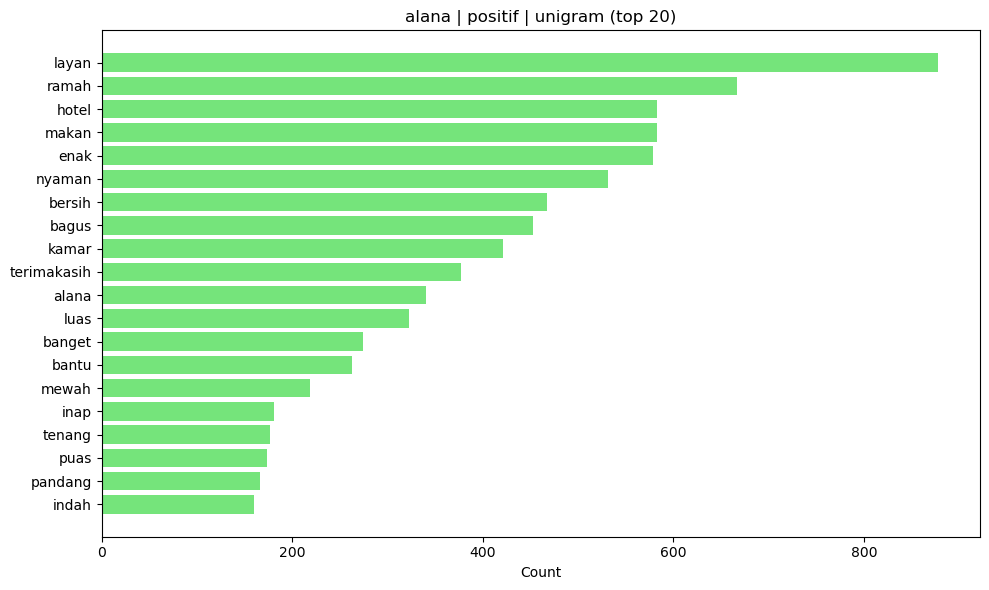

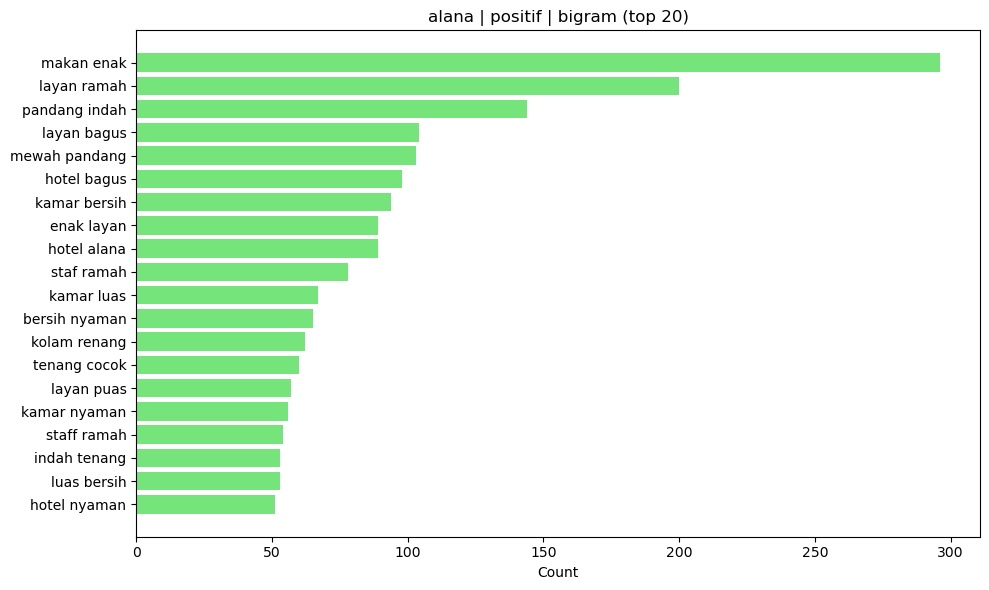

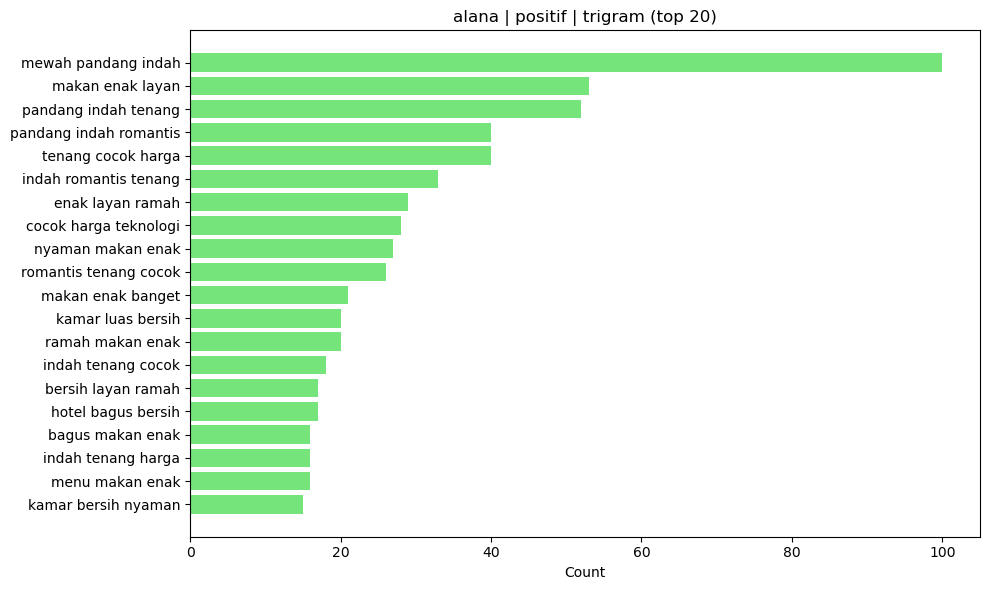

- netral | rows: 95


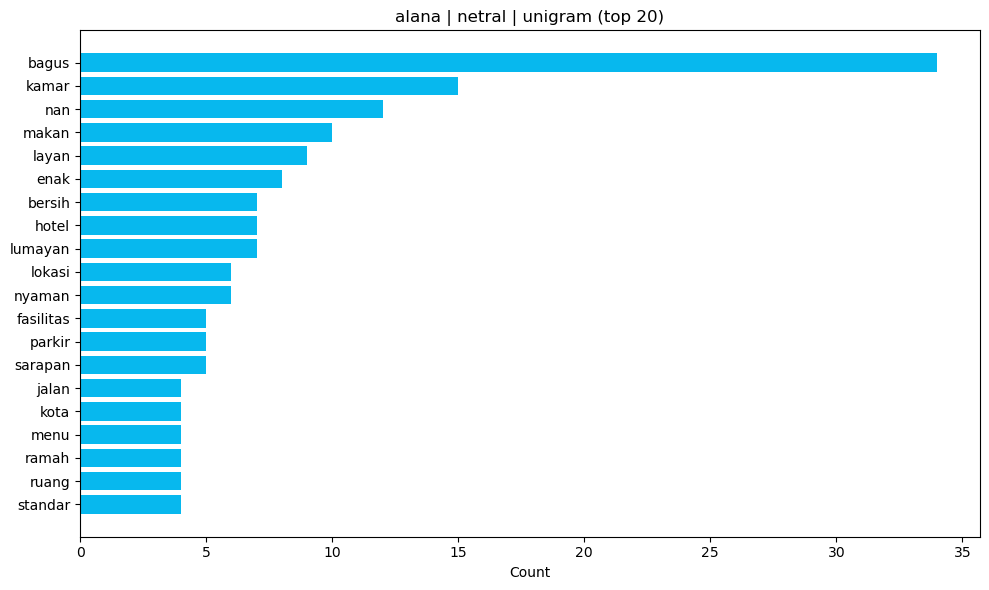

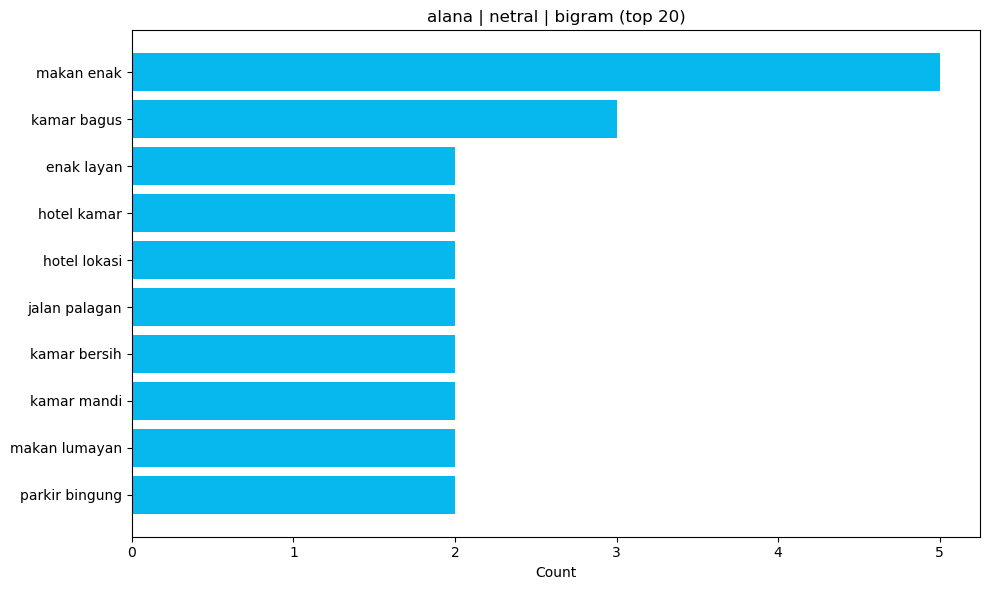

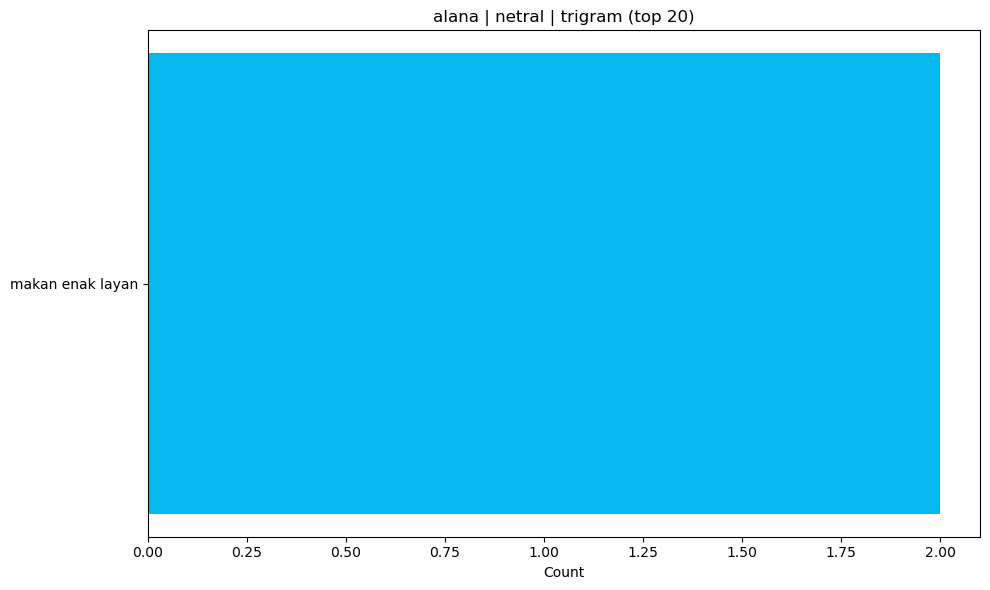

- negatif | rows: 9


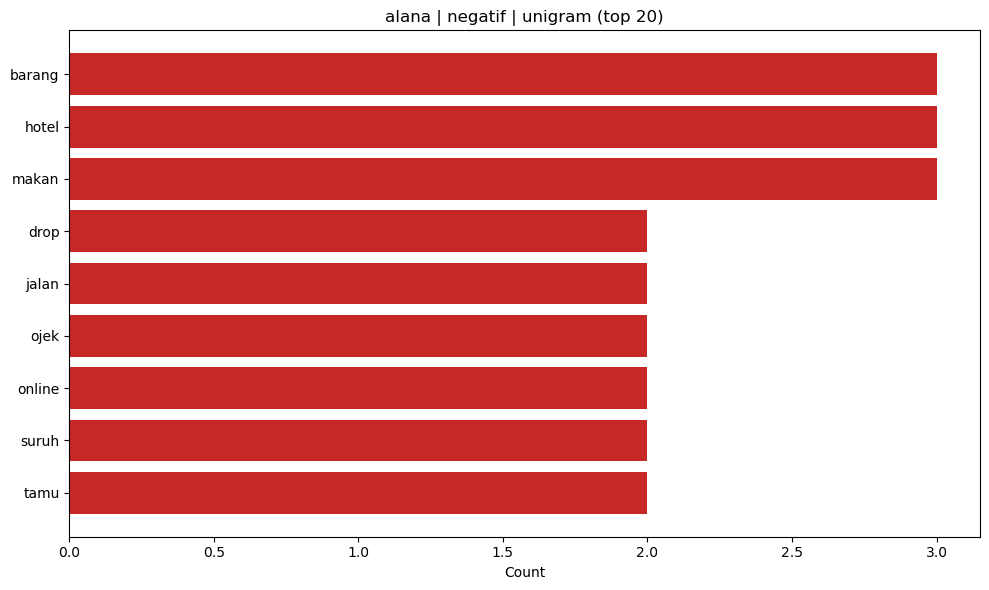

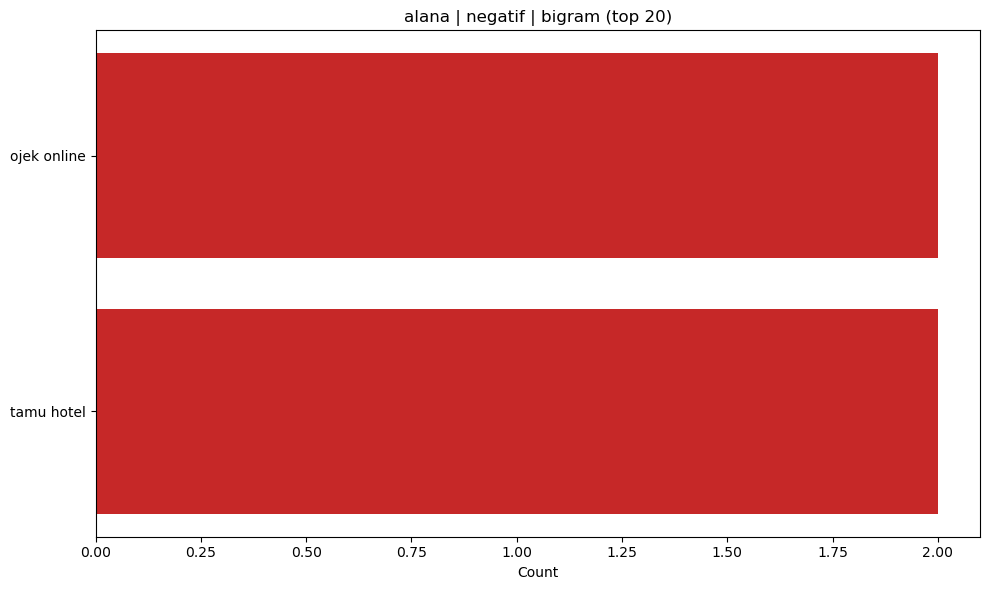

ValueError: After pruning, no terms remain. Try a lower min_df or a higher max_df.

In [ ]:
generate_plots_for_dataset('alana', 'data/alana_validated_lexicon.csv')


## Run: Mercure


=== DATASET: mercure | rows: 1177 ===
- positif | rows: 1042


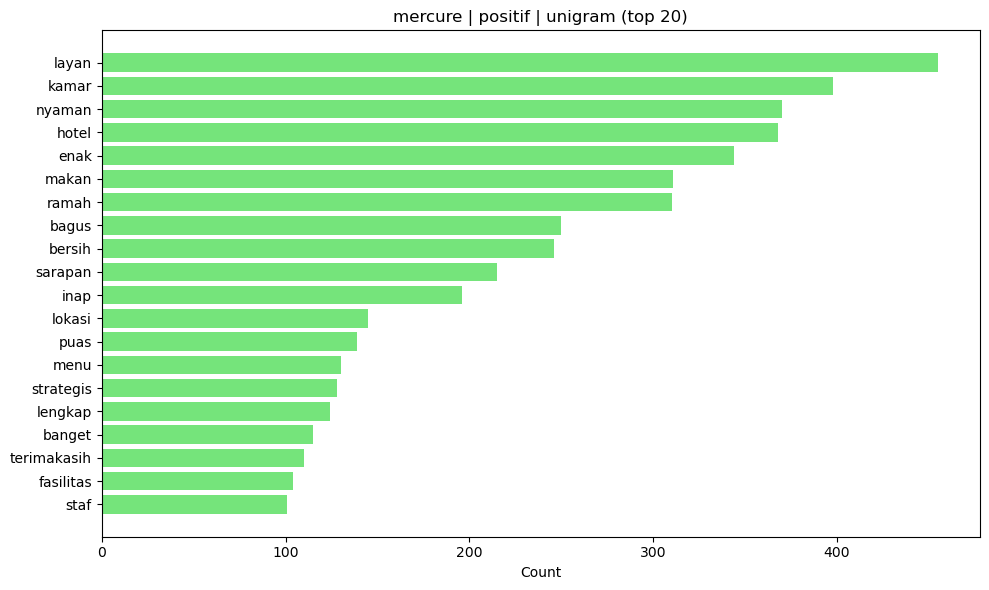

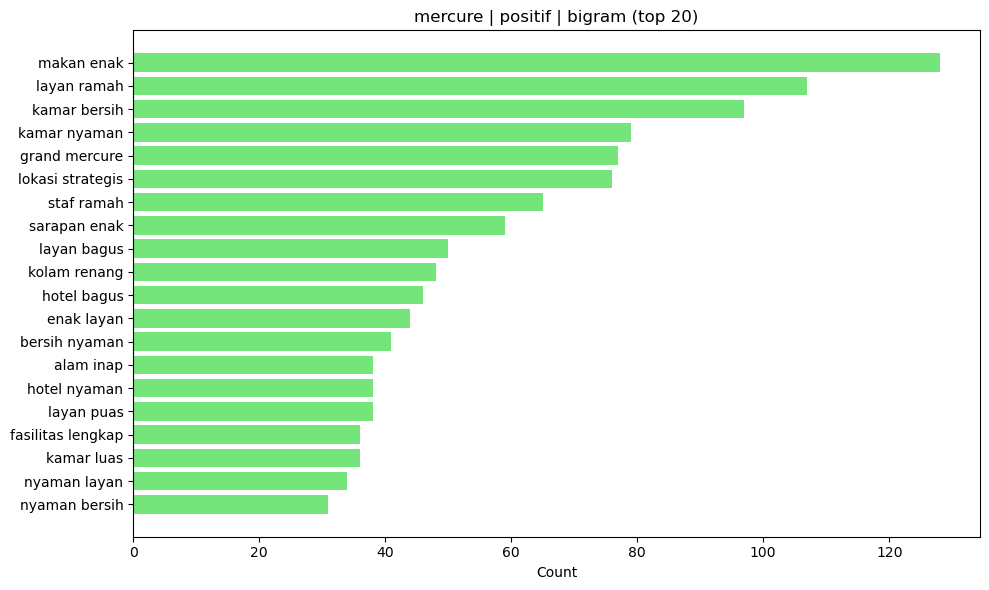

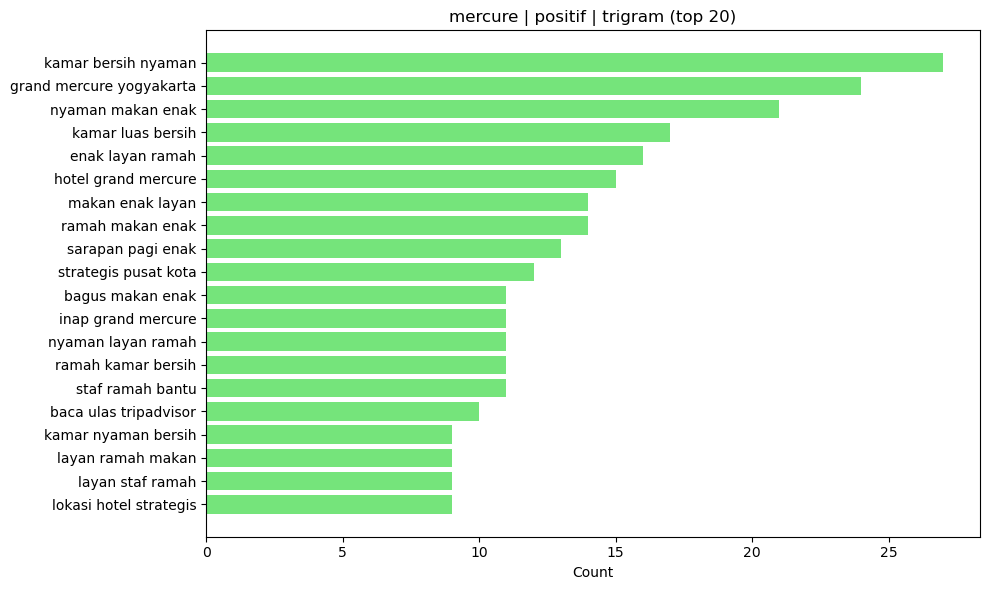

- netral | rows: 93


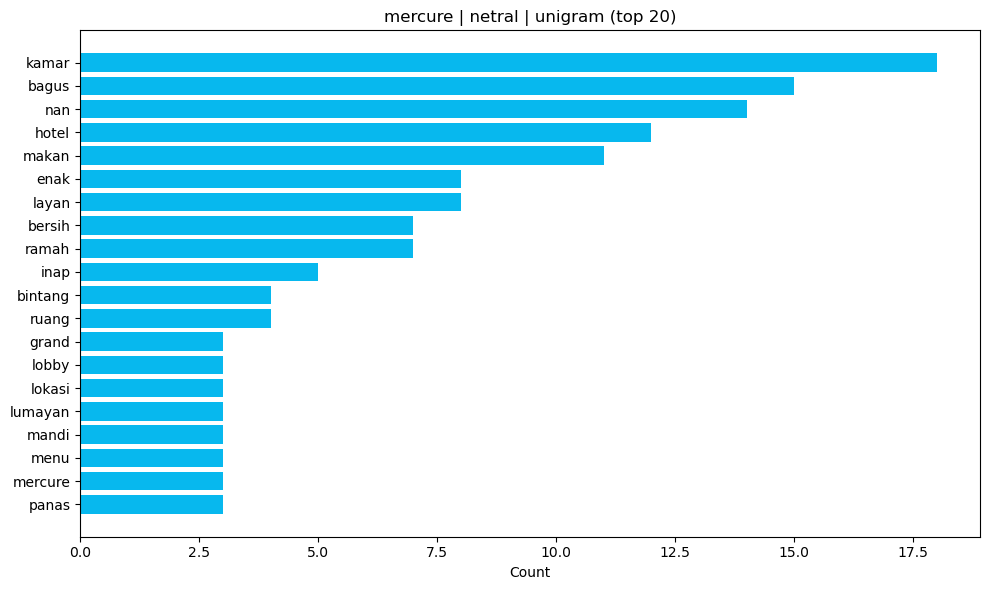

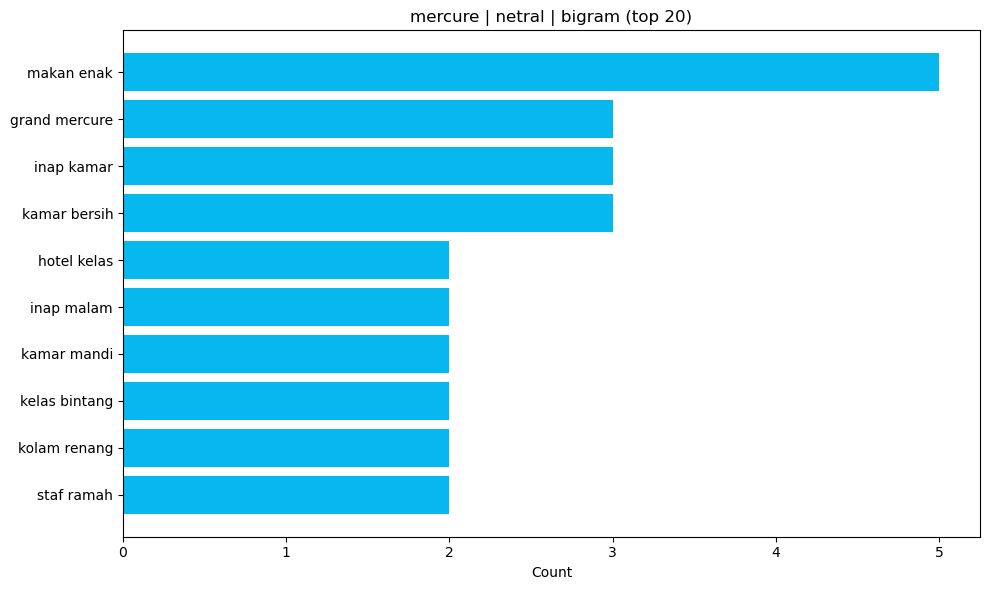

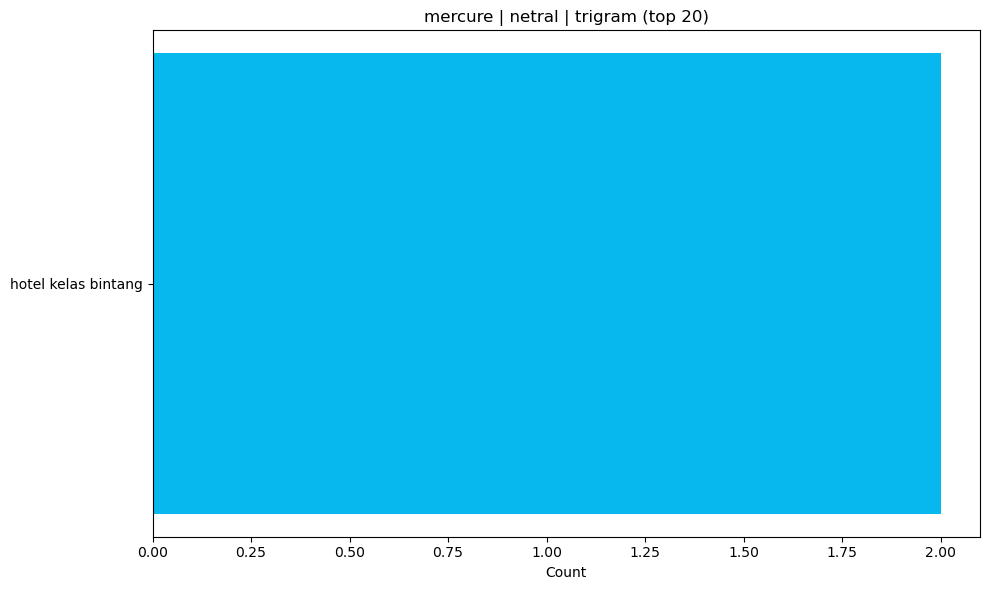

- negatif | rows: 42


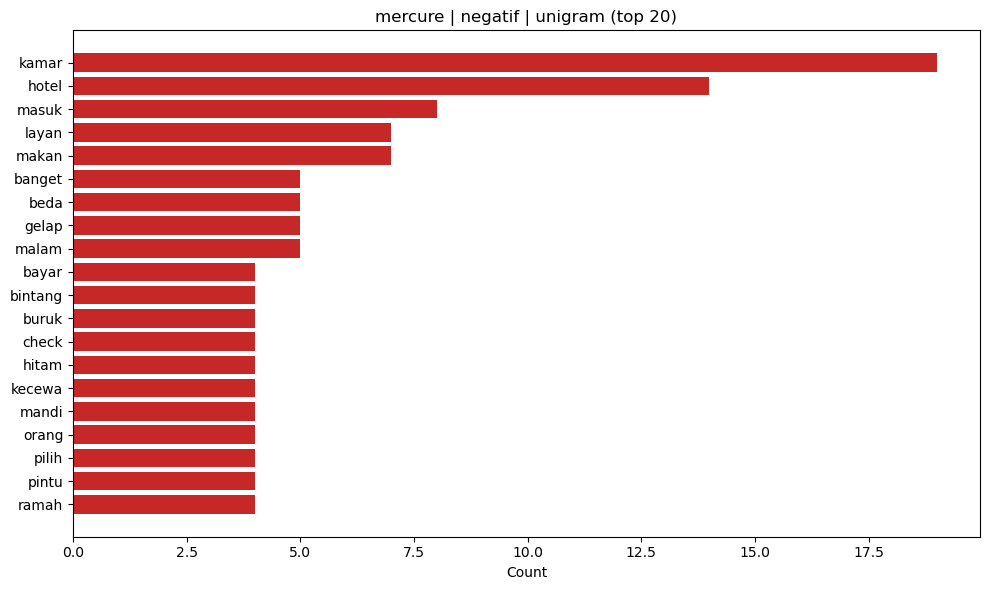

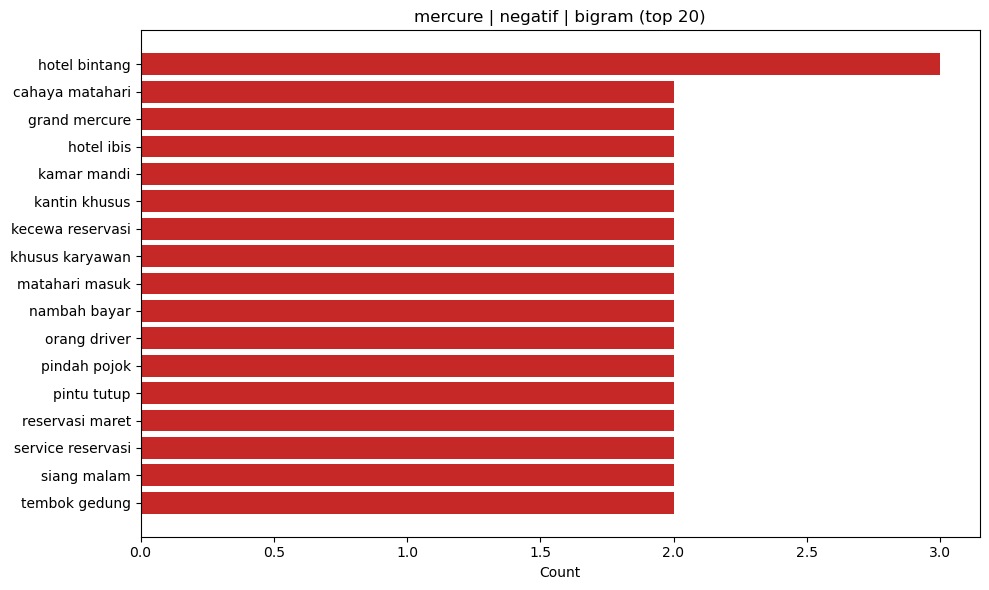

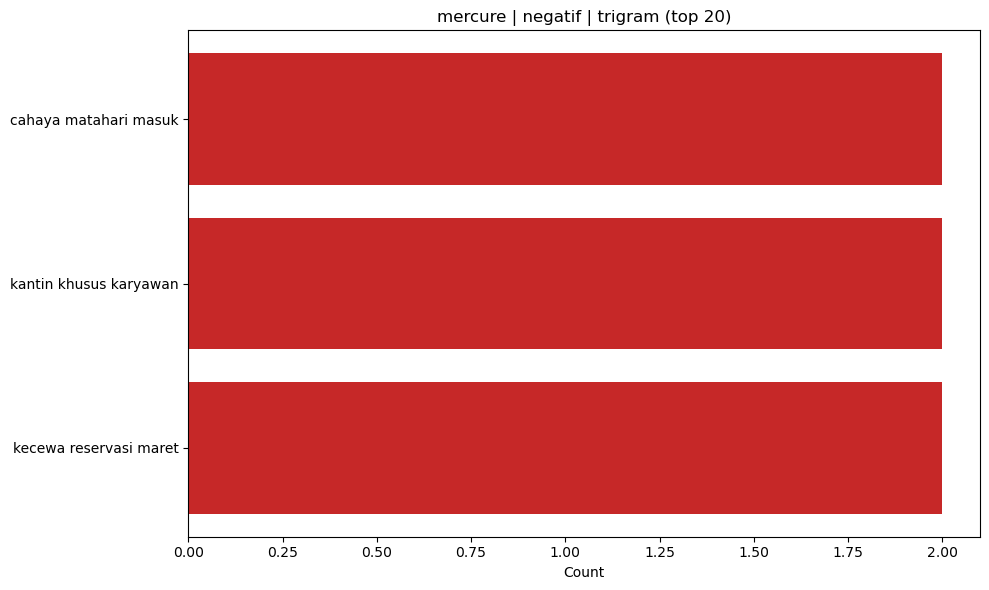

Gambar tersimpan di: data/ngram_plots


In [ ]:
generate_plots_for_dataset('mercure', 'data/mercure_validated_lexicon.csv')


## Run: Tentrem


=== DATASET: tentrem | rows: 1459 ===
- positif | rows: 1358


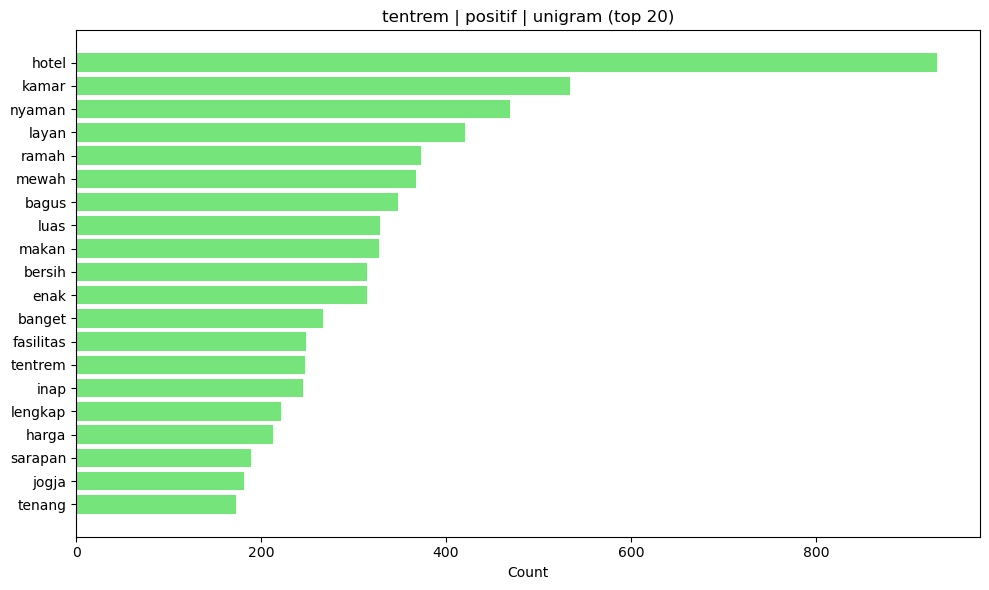

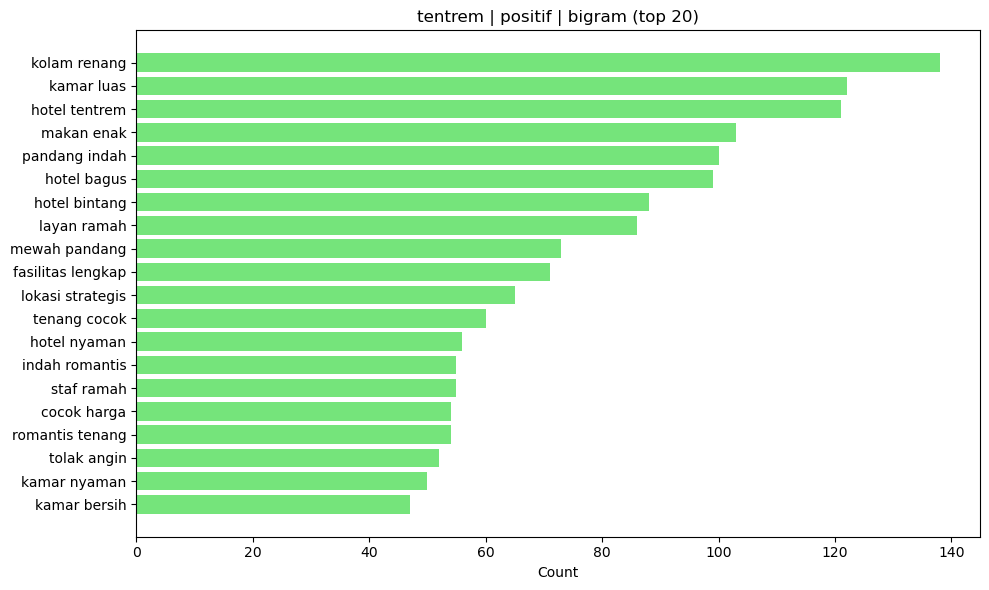

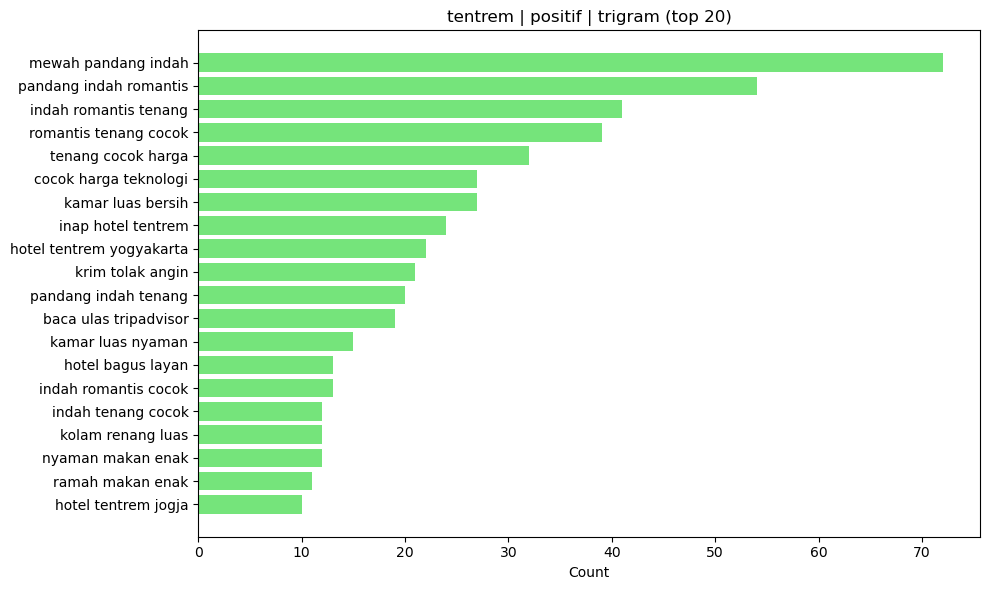

- netral | rows: 47


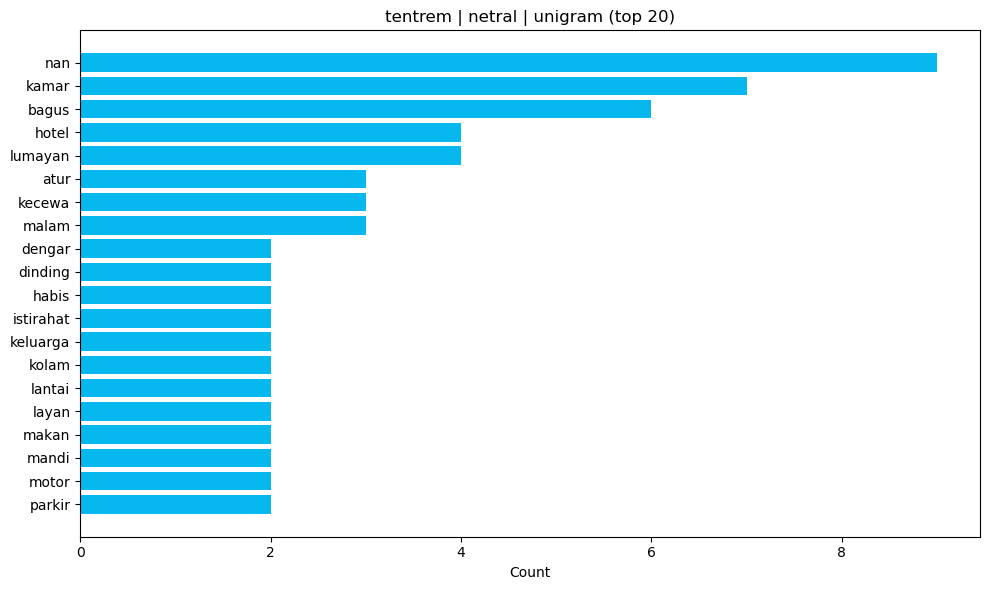

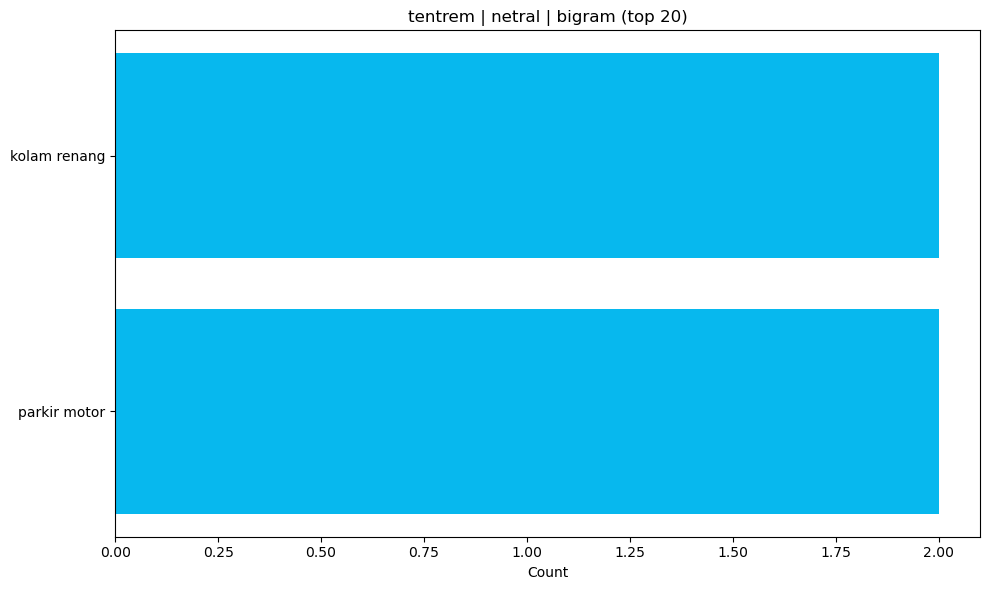

ValueError: After pruning, no terms remain. Try a lower min_df or a higher max_df.

In [ ]:
generate_plots_for_dataset('tentrem', 'data/tentrem_validated_lexicon.csv')


# 6. Wrodcloud

## Wordcloud

Membuat wordcloud dari `Clean_Text` (global dan per label) untuk tiap dataset.

Catatan: butuh package `wordcloud` dan `matplotlib`.


In [ ]:
# (opsional) install kalau belum ada
%pip install -q wordcloud matplotlib


Note: you may need to restart the kernel to use updated packages.


In [ ]:
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
from wordcloud import WordCloud

OUT_DIR = Path('data/wordcloud')
OUT_DIR.mkdir(parents=True, exist_ok=True)

LABELS = ['positif','netral','negatif']

def make_wordcloud(texts, *, title, out_path=None, width=1200, height=600, max_words=200):
    text = ' '.join(texts.astype(str).tolist())
    wc = WordCloud(width=width, height=height, background_color='white', max_words=max_words)
    wc.generate(text)

    plt.figure(figsize=(14, 7))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title(title)
    plt.tight_layout()
    if out_path is not None:
        plt.savefig(out_path, dpi=200)
    plt.show()

def run_wordcloud_for_dataset(name, path):
    df = pd.read_csv(path)
    df['Clean_Text'] = df['Clean_Text'].astype(str)
    df['label'] = df['label'].astype(str).str.lower()

    print('=== DATASET:', name, '| rows:', len(df), '===')

    # global
    make_wordcloud(
        df['Clean_Text'],
        title=f'Wordcloud (global) - {name}',
        out_path=OUT_DIR / f'{name}_global.png',
    )

    # per label
    for label in LABELS:
        sub = df[df['label'] == label]
        if len(sub) == 0:
            continue
        make_wordcloud(
            sub['Clean_Text'],
            title=f'Wordcloud ({label}) - {name}',
            out_path=OUT_DIR / f'{name}_{label}.png',
        )

    print('Gambar tersimpan di:', OUT_DIR)


## Run: Alana


=== DATASET: alana | rows: 1857 ===


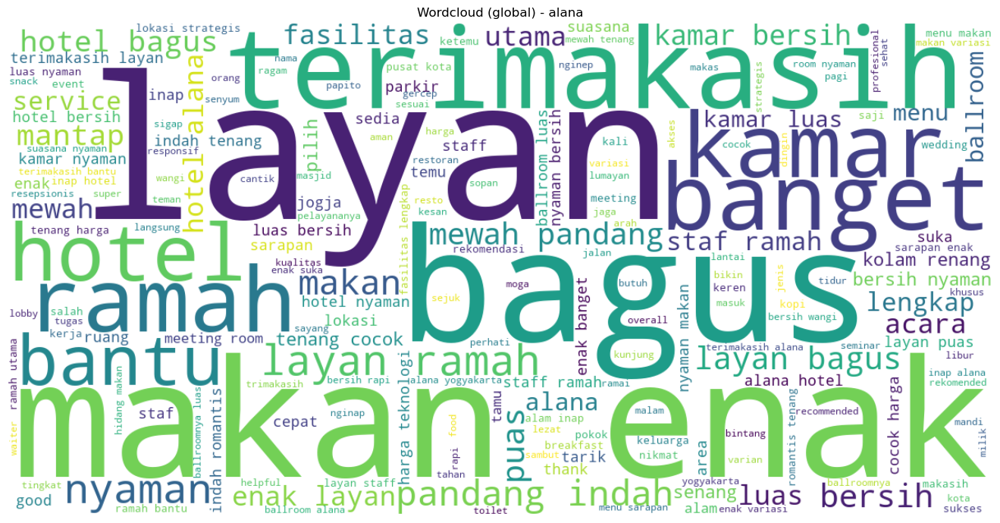

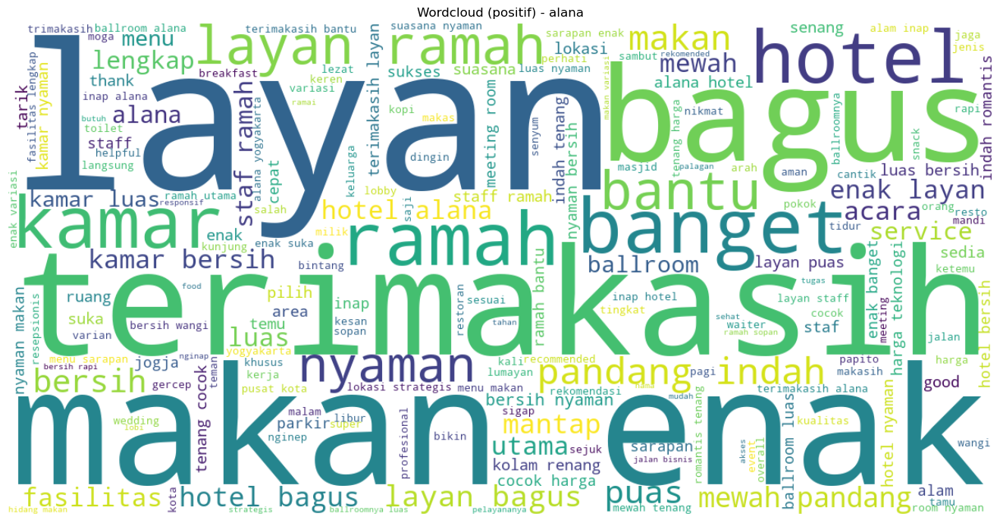

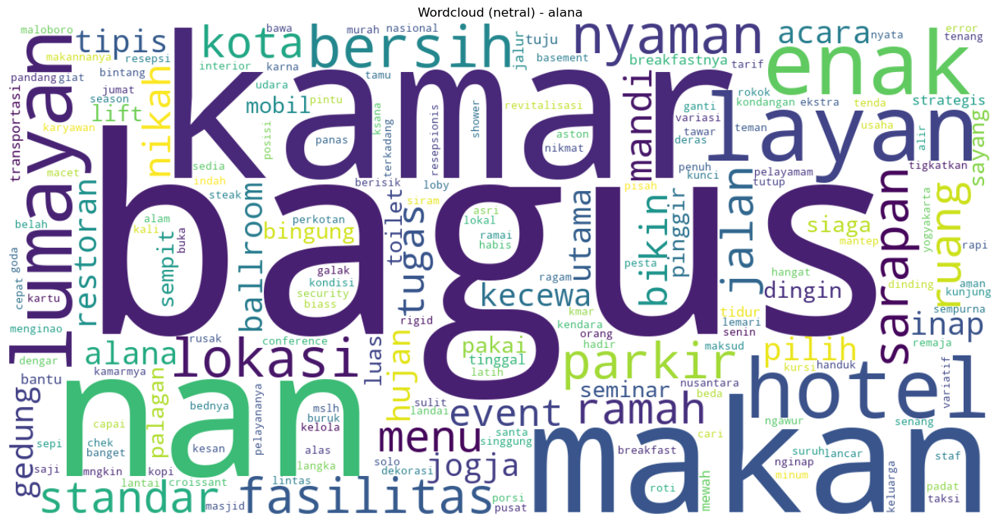

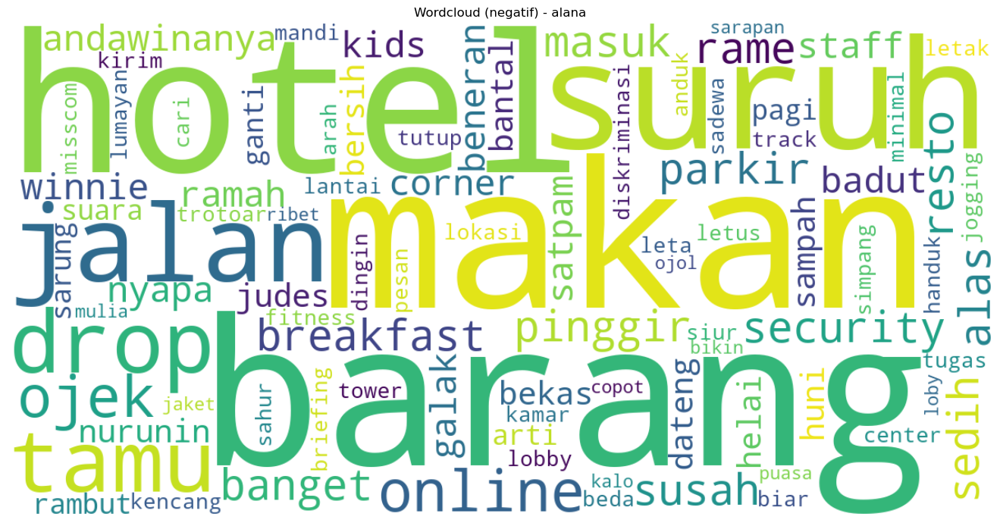

Gambar tersimpan di: data/wordcloud


In [ ]:
run_wordcloud_for_dataset('alana', 'data/alana_validated_lexicon.csv')


## Run: Mercure


=== DATASET: mercure | rows: 1177 ===


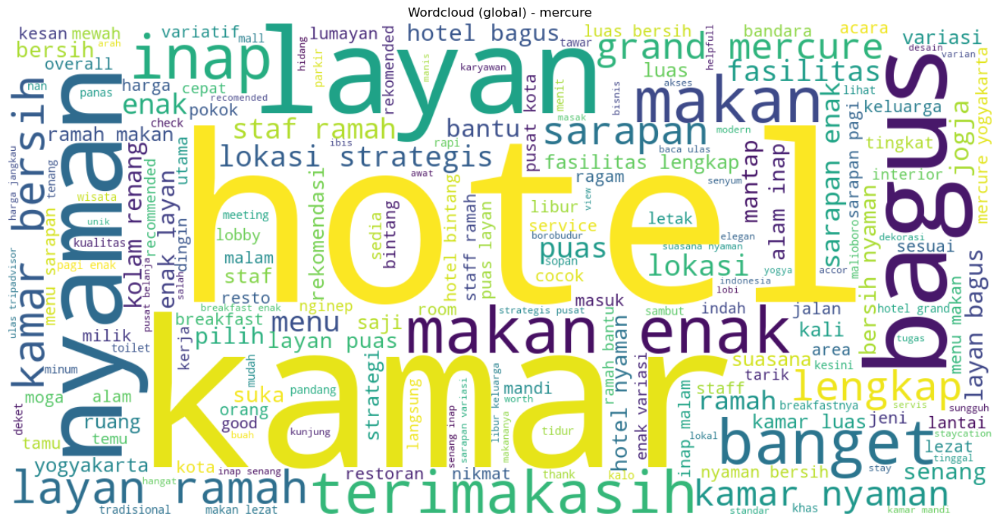

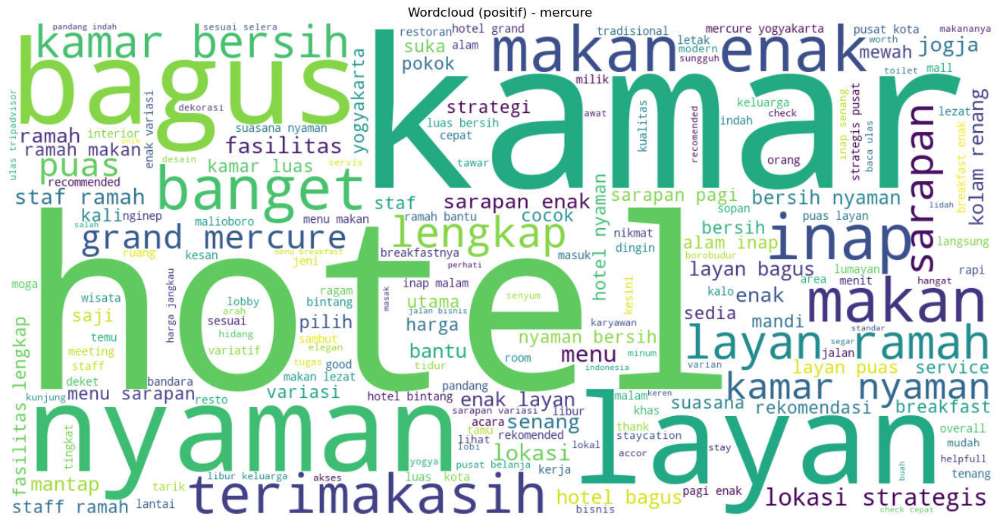

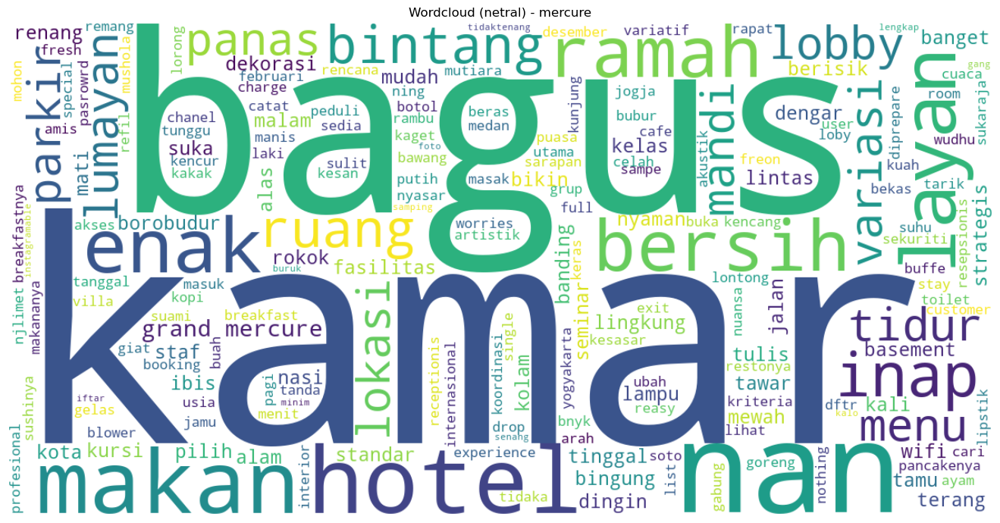

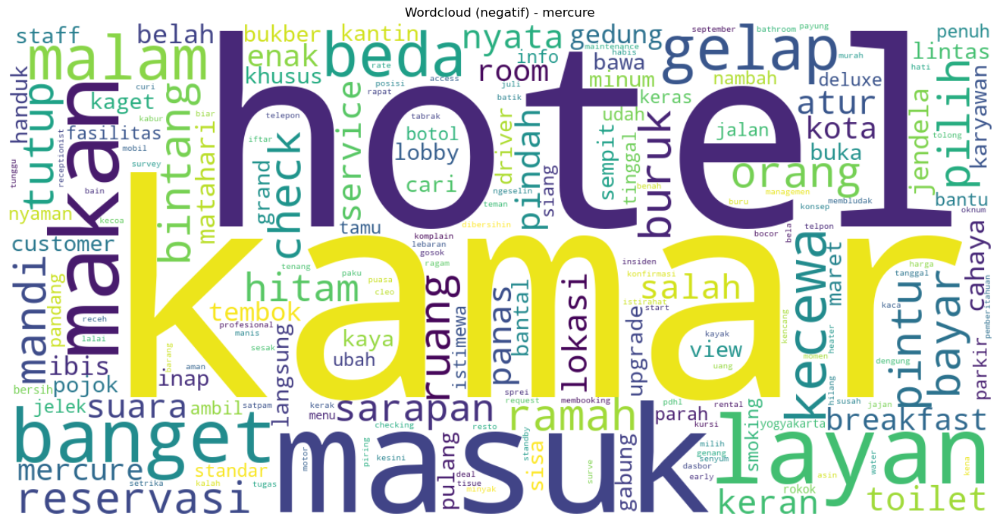

Gambar tersimpan di: data/wordcloud


In [ ]:
run_wordcloud_for_dataset('mercure', 'data/mercure_validated_lexicon.csv')


## Run: Tentrem


=== DATASET: tentrem | rows: 1459 ===


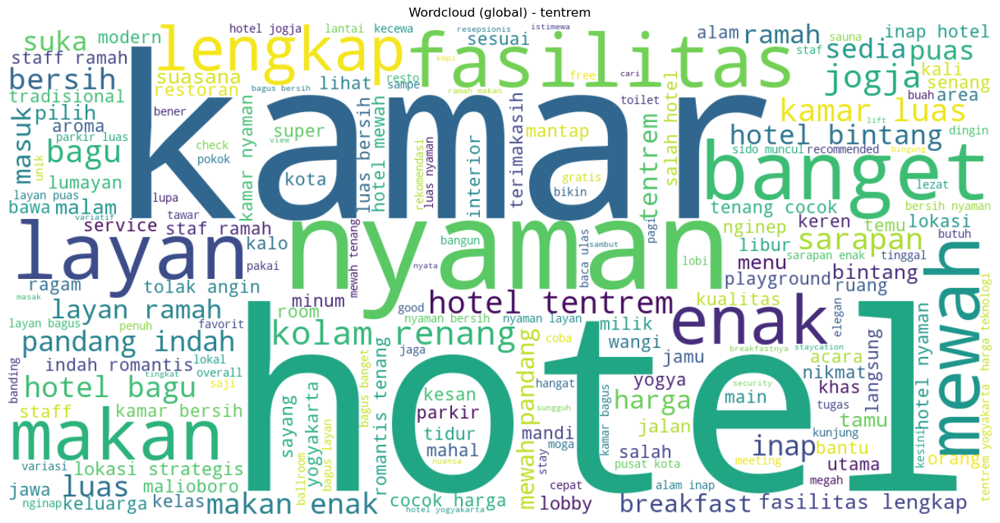

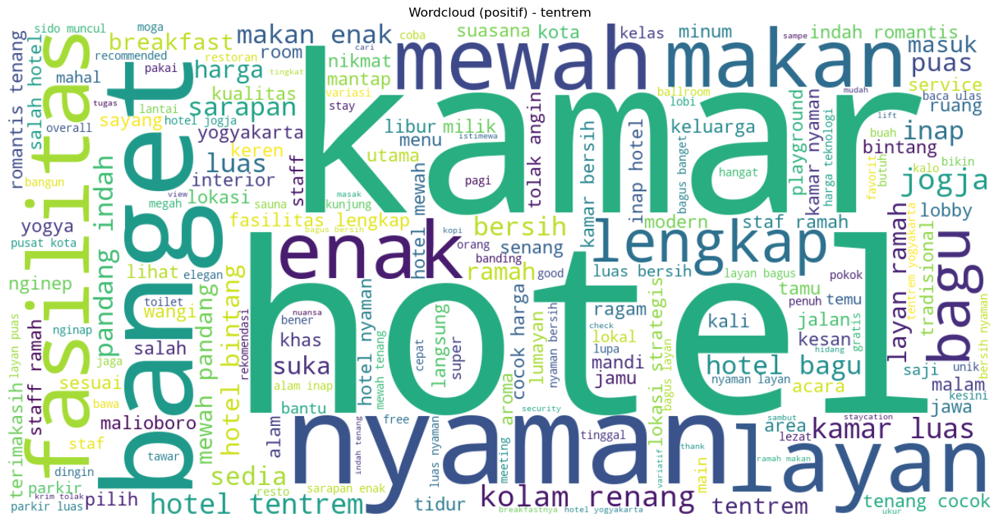

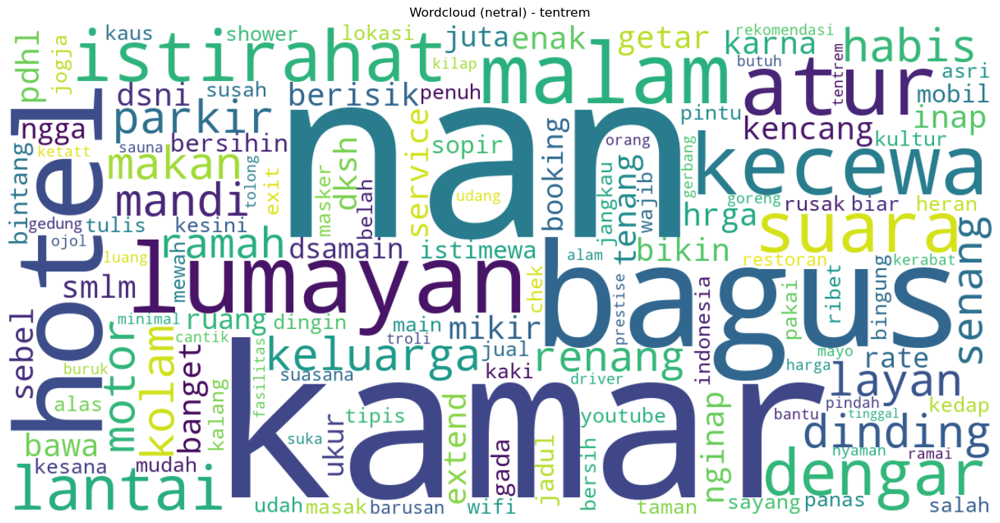

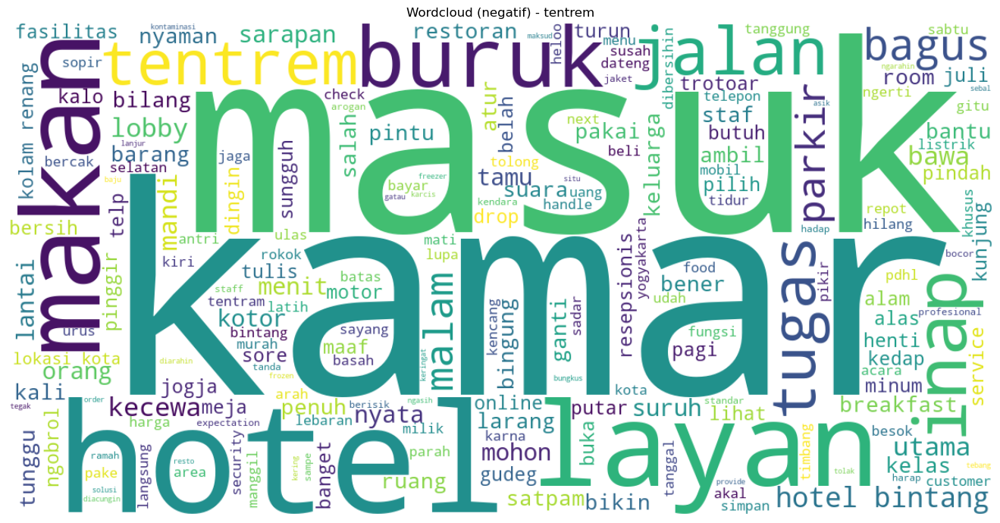

Gambar tersimpan di: data/wordcloud


In [ ]:
run_wordcloud_for_dataset('tentrem', 'data/tentrem_validated_lexicon.csv')
